# (A) Dependencies
- It just need the libraries. There is no further installation dependency.
- You can download and load the dataset via seaborn library.

## Libraries

In [568]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# (B) Dataset

## Getting the Dataset

In [569]:
dataset_name = "titanic"

In [570]:
# Download & load the dataset via seaborn lib
df = sns.load_dataset(dataset_name)
df.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


## Meta Data of The Dataset
- Description
  - The titanic and titanic2 data frames describe the survival status of individual passengers
- Tasks
  - Classify the passengers into survived, or not.
on the Titanic
- VARIABLE DESCRIPTIONS
  - Pclass Passenger Class (1 = 1st; 2 = 2nd; 3 = 3rd)
  - survival Survival (0 = No; 1 = Yes)
  - name Name
  - sex Sex
  - age Age
  - sibsp Number of Siblings/Spouses Aboard
  - parch Number of Parents/Children Aboard
  - ticket Ticket Number
  - fare Passenger Fare (British pound)
  - cabin Cabin
  - embarked Port of Embarkation (C = Cherbourg; Q = Queenstown; S = Southampton)
  - boat Lifeboat
  - body Body Identification Number
  - home.dest Home/Destination

## Attributes & Stats of the dataset

In [571]:
# Dataset information (record size, variables, non-null counts, dtypes  etc...)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     891 non-null    int64   
 1   pclass       891 non-null    int64   
 2   sex          891 non-null    object  
 3   age          714 non-null    float64 
 4   sibsp        891 non-null    int64   
 5   parch        891 non-null    int64   
 6   fare         891 non-null    float64 
 7   embarked     889 non-null    object  
 8   class        891 non-null    category
 9   who          891 non-null    object  
 10  adult_male   891 non-null    bool    
 11  deck         203 non-null    category
 12  embark_town  889 non-null    object  
 13  alive        891 non-null    object  
 14  alone        891 non-null    bool    
dtypes: bool(2), category(2), float64(2), int64(4), object(5)
memory usage: 80.7+ KB


In [572]:
# Descriptive stats of the dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
survived,891.0,0.383838,0.486592,0.00,0.0000,0.0000,1.0,1.0000
pclass,891.0,2.308642,0.836071,1.00,2.0000,3.0000,3.0,3.0000
age,714.0,29.699118,14.526497,0.42,20.1250,28.0000,38.0,80.0000
sibsp,891.0,0.523008,1.102743,0.00,0.0000,0.0000,1.0,8.0000
parch,891.0,0.381594,0.806057,0.00,0.0000,0.0000,0.0,6.0000
fare,891.0,32.204208,49.693429,0.00,7.9104,14.4542,31.0,512.3292


In [573]:
# Distribution of target variable's classes
df["survived"].value_counts()

0    549
1    342
Name: survived, dtype: int64

# (C) Preprocessing the dataset

## Adjusting data types

### Type Casting on target classes from object to categorical 

In [574]:
cat_cols = df.select_dtypes(include=["object"]).columns
cat_cols

Index(['sex', 'embarked', 'who', 'embark_town', 'alive'], dtype='object')

In [575]:
num_cols = df.select_dtypes(include=["int64","float64"]).columns
num_cols

Index(['survived', 'pclass', 'age', 'sibsp', 'parch', 'fare'], dtype='object')

In [576]:
 df[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   sex          891 non-null    object
 1   embarked     889 non-null    object
 2   who          891 non-null    object
 3   embark_town  889 non-null    object
 4   alive        891 non-null    object
dtypes: object(5)
memory usage: 34.9+ KB


In [577]:
 df[cat_cols] = df[cat_cols].astype('category')

In [578]:
 df[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   sex          891 non-null    category
 1   embarked     889 non-null    category
 2   who          891 non-null    category
 3   embark_town  889 non-null    category
 4   alive        891 non-null    category
dtypes: category(5)
memory usage: 5.1 KB


In [579]:
for col in cat_cols:
  print(f"{col}: ", df[col].unique(), end="\n"*2)

sex:  ['male', 'female']
Categories (2, object): ['female', 'male']

embarked:  ['S', 'C', 'Q', NaN]
Categories (3, object): ['C', 'Q', 'S']

who:  ['man', 'woman', 'child']
Categories (3, object): ['child', 'man', 'woman']

embark_town:  ['Southampton', 'Cherbourg', 'Queenstown', NaN]
Categories (3, object): ['Cherbourg', 'Queenstown', 'Southampton']

alive:  ['no', 'yes']
Categories (2, object): ['no', 'yes']



### Grouping by dtypes
Grouping dataset according to numerical and categorical for further process

In [580]:
df_num = df.select_dtypes(include=["float64","int64"])
df_num.head(0)

,survived,pclass,age,sibsp,parch,fare


In [581]:
df_cat = df.select_dtypes(include=["category"])
df_cat.head(0)

,sex,embarked,class,who,deck,embark_town,alive


## Feature Engineering

### Creation of new attributes 

In [582]:
def visual_compare(before:pd.Series, after:pd.Series, figsize:tuple=(20,5)):

  plt.figure(figsize=figsize)

  plt.subplot(2,2,1)
  sns.distplot(before)

  plt.subplot(2,2,2)
  sns.boxplot(before)
  
  plt.subplot(2,2,3)
  sns.distplot(after)
  
  plt.subplot(2,2,4)
  sns.boxplot(after)


In [583]:
def IQR_calculator(df, ratio=1.5):
    # Calculating the quartiles
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    
    # IQR range calculation
    IQR = Q3 -Q1

    # Determinating the boundaries
    lower_threashold = Q1 - ratio * IQR
    higher_threashold = Q3 + ratio *IQR
    
    return IQR, lower_threashold, higher_threashold

def find_outlier(df:pd.DataFrame, lower_threashold:pd.Series, higher_threashold:pd.Series)->pd.DataFrame:
    data = df[lower_threashold.index]
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df, df_num.columns

def find_outlier_single(data:pd.DataFrame, lower_threashold:float, higher_threashold:float)->pd.DataFrame:
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df

In [584]:
def outlier_ratio_compare(before:pd.Series, after:pd.Series, iqr_ratio:float=1.5):

  # calculating IQR to findout outliers
  b_l_th, b_h_th = IQR_calculator(before, ratio=iqr_ratio)[1:]
  a_l_th, a_h_th = IQR_calculator(after, ratio=iqr_ratio)[1:]

  # fidning out the outlier
  b_is_outlier = find_outlier_single(before, b_l_th, b_h_th)
  a_is_outlier = find_outlier_single(after, a_l_th, a_h_th)

  # calculating the outlier ratio through outlier count over total count.
  b_outlier_ratio = np.round(b_is_outlier.sum()/before.count(), 3)
  a_outlier_ratio = np.round(a_is_outlier.sum()/after.count(), 3)
  change = np.round(a_outlier_ratio - b_outlier_ratio, 3)

  return b_outlier_ratio, a_outlier_ratio, change

#### Via Log Transformation

In [585]:
df['fare_log'] = np.log(df['fare']+1)

In [586]:
transformed_cols = [
    ("fare", "fare_log"),
]

In [587]:
num_cols = df.select_dtypes(include=("int64", "float64")).columns

In [588]:
num_cols

Index(['survived', 'pclass', 'age', 'sibsp', 'parch', 'fare', 'fare_log'], dtype='object')

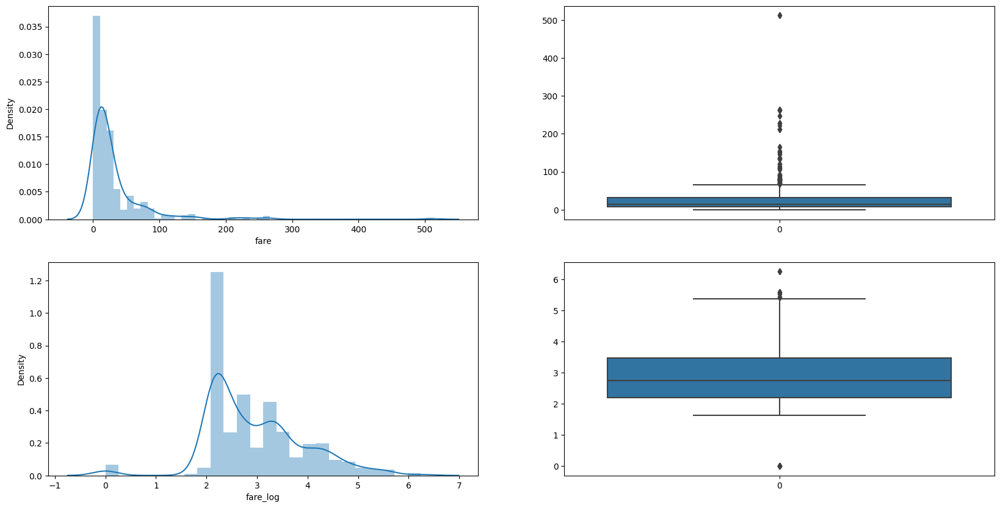

In [589]:
visual_compare(before = df["fare"], after = df['fare_log'], figsize=(20,10))

In [590]:
b, a, d= outlier_ratio_compare(before = df["fare"], after = df['fare_log'])
print(f"before outlier ratio: {b}\nafter outlier ratio: {a}\nchanging: {d}")

before outlier ratio: 0.13
after outlier ratio: 0.035
changing: -0.095


### Adjusting the dataset according to new variables


In [591]:
# drop unnecessary columns
df["fare"] = df["fare_log"]
drop_cols = ['fare_log']
df = df.drop(columns=drop_cols, axis=1)

In [592]:
df.columns

Index(['survived', 'pclass', 'sex', 'age', 'sibsp', 'parch', 'fare',
       'embarked', 'class', 'who', 'adult_male', 'deck', 'embark_town',
       'alive', 'alone'],
      dtype='object')

In [593]:
num_cols = list(df.select_dtypes(include=("int64", "float64")).columns)
cat_cols = [col for col in df.columns if col not in num_cols]

In [594]:
num_cols

['survived', 'pclass', 'age', 'sibsp', 'parch', 'fare']

In [595]:
cat_cols

['sex',
 'embarked',
 'class',
 'who',
 'adult_male',
 'deck',
 'embark_town',
 'alive',
 'alone']

## Missing Value

### Finding out the missing values

In [596]:
# find the null values
df.isnull().sum()

survived         0
pclass           0
sex              0
age            177
sibsp            0
parch            0
fare             0
embarked         2
class            0
who              0
adult_male       0
deck           688
embark_town      2
alive            0
alone            0
dtype: int64

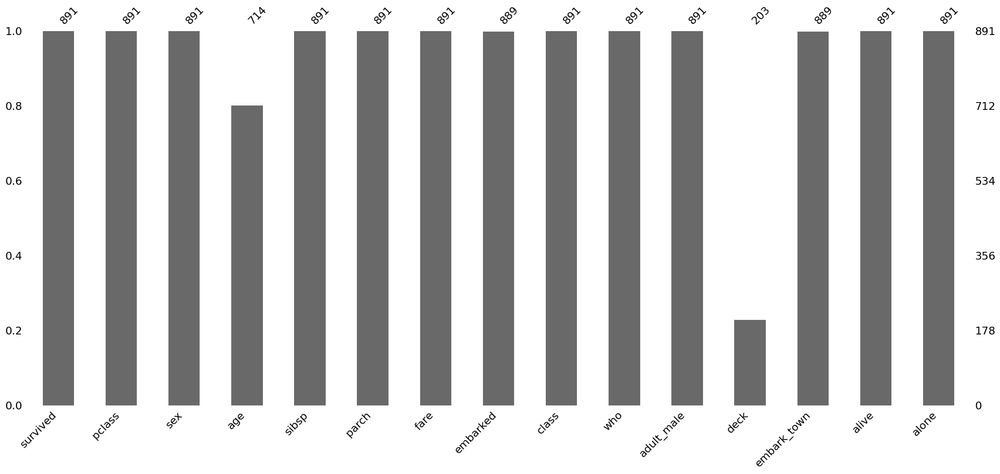

In [597]:
import missingno as msno
msno.bar(df);

<Axes: >

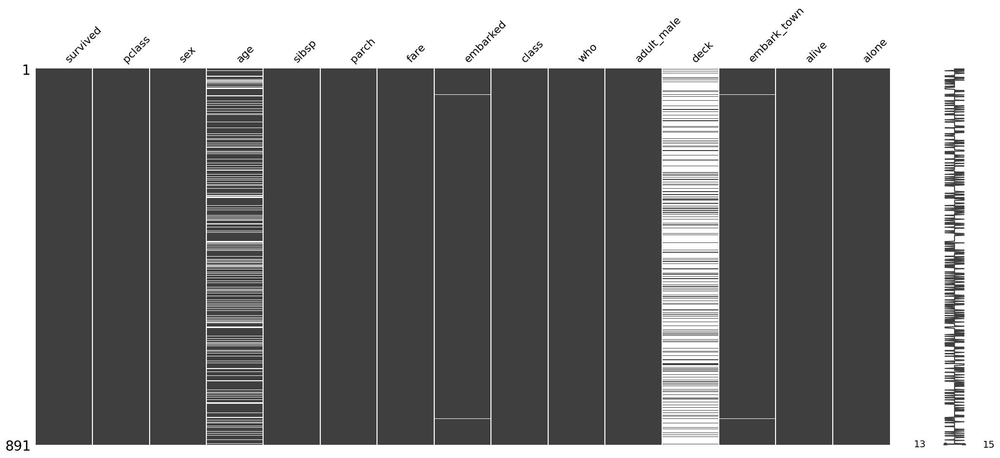

In [598]:
msno.matrix(df)

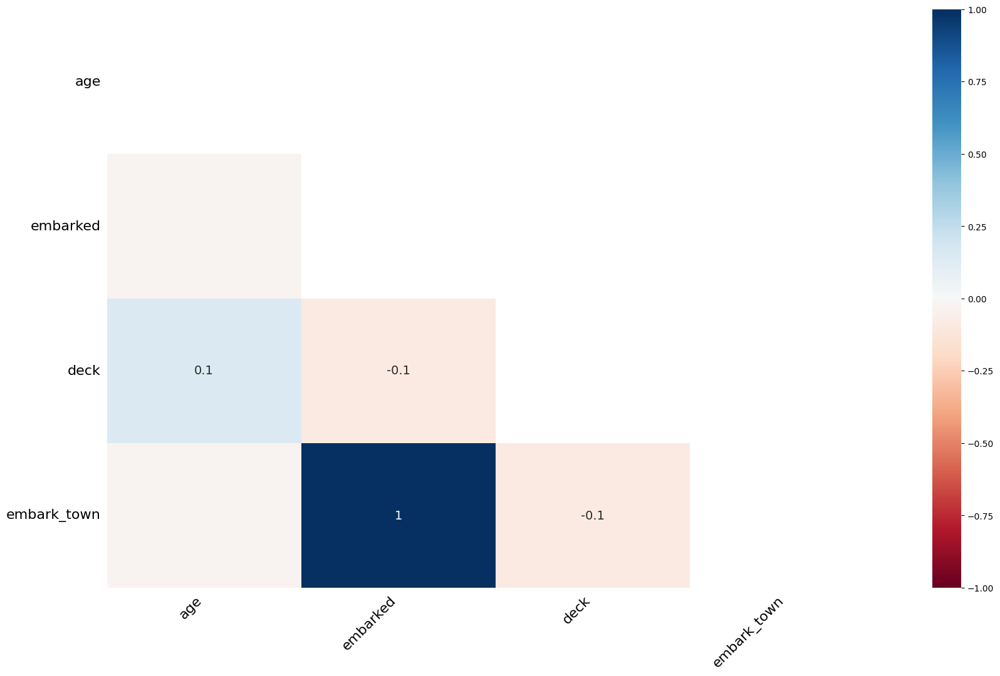

In [599]:
msno.heatmap(df);

### Handling The Missing Values

#### Remove
```python
# (ROW), at least one missing value in the observation
df.dropna()

# (ROW) just remove the observation which the all variables are missed 
df.dropna(how='all')

# col
df.dropna(axis=1)
df.dropna(axis=1, how="all")

# (Row) Remove the rows which %50 and more of the features is missed
th_miss_feat_size = len(df.columns) // 2
df.dropna(thresh=th_miss_feat_size)
```

In [600]:
df["deck"].isnull().sum() / (df["deck"].count() + df["deck"].isnull().sum()) 

0.7721661054994389

In [601]:
df.drop(["deck"], axis=1, inplace=True)

In [602]:
df["age"].isnull().sum() / (df["age"].count() + df["age"].isnull().sum()) 

0.19865319865319866

#### Imputate with stat (Implemented)




In [603]:
df.isnull().sum()

survived         0
pclass           0
sex              0
age            177
sibsp            0
parch            0
fare             0
embarked         2
class            0
who              0
adult_male       0
embark_town      2
alive            0
alone            0
dtype: int64

In [604]:
cat_cols = df.select_dtypes(include=["category","object"]).columns
num_cols = df.select_dtypes(include=["int64","float64"]).columns

In [605]:
# Continous imputation with the mean of the corresponding feature
df[num_cols] = df[num_cols].apply(lambda col: col.fillna(col.mean()), axis = 0)

In [606]:
# Categorical imputation with the most frequently label
df[cat_cols] = df[cat_cols].apply(lambda col: col.fillna(col.mode()[0]), axis = 0)

In [607]:
df.isnull().sum()

survived       0
pclass         0
sex            0
age            0
sibsp          0
parch          0
fare           0
embarked       0
class          0
who            0
adult_male     0
embark_town    0
alive          0
alone          0
dtype: int64

#### Imputate through prediction (not implemented)

```python
from fancyimpute import KNN

knn_imputed= KNN(k=5).fit_transform(df)
df_imputed = pd.DataFrame(knn_imputed, columns = df.columns)
```

```python
# Imputating with KNN via ycimpute 
from ycimpute.imputer import knnimput

knn_imputed = knnimput.KNN(k=4).complete(np.array(df))
df_imputed = pd.DataFrame(knn_imputed, columns= df.columns)
```

```python
# Imputating with Random Forest via ycimpute 
from ycimpute.imputer import iterforest

rf_imputed = iterforest.IterImput().complete(np.array(df))
df_imputed = pd.DataFrame(rf_imputed, columns = df.columns)
```

```python
# Imputing with EM via ycimpute 
from ycimpute.imputer import EM

em_imputed = EM().complete(np.array(df))
df_imputed = pd.DataFrame(em_imputed, columns=var_names)
```

## Outlier Analysis

### Visual Approach

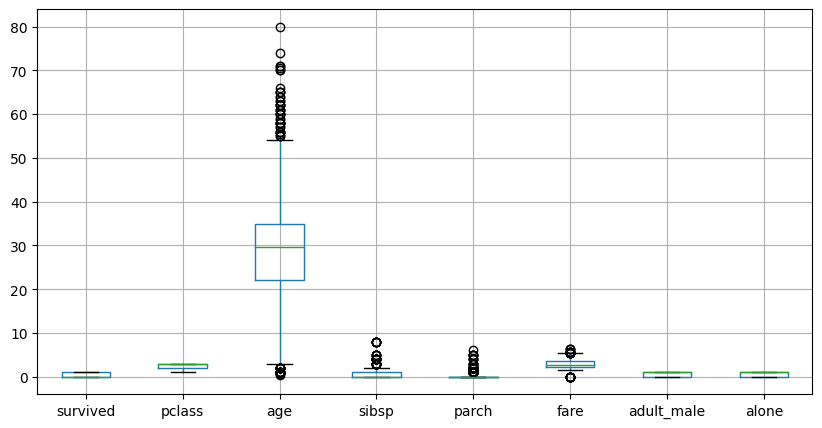

In [608]:
plt.figure(figsize=(10,5));
df.boxplot();

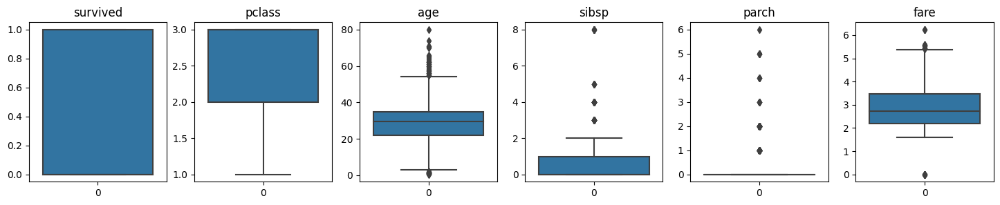

In [609]:
cum_col_sie = len(num_cols)

plt.figure(figsize=(18, 3))
for i, col in enumerate(num_cols):
  plt.subplot(1, cum_col_sie, i+1)
  sns.boxplot(df[col]);
  plt.title(col)

In [610]:
num_cols

Index(['survived', 'pclass', 'age', 'sibsp', 'parch', 'fare'], dtype='object')

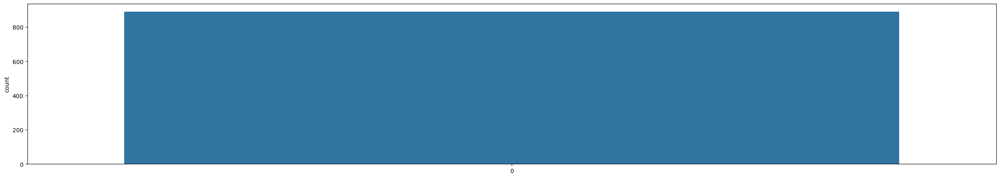

In [611]:
plt.figure(figsize=(30, 5))
sns.countplot(df["survived"]);

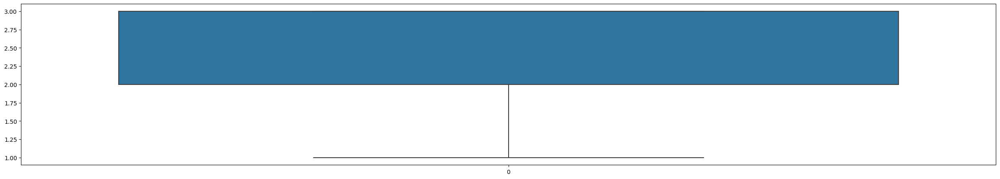

In [612]:
plt.figure(figsize=(30, 5))
sns.boxplot(df["pclass"]);

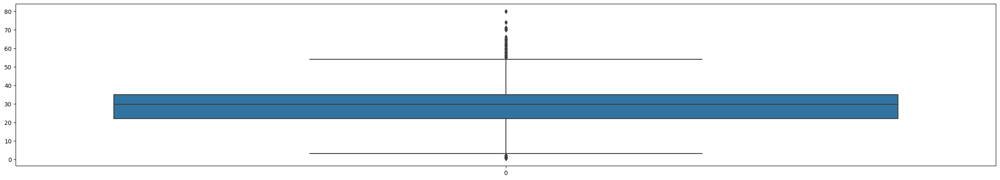

In [613]:
plt.figure(figsize=(30, 5))
sns.boxplot(df["age"]);

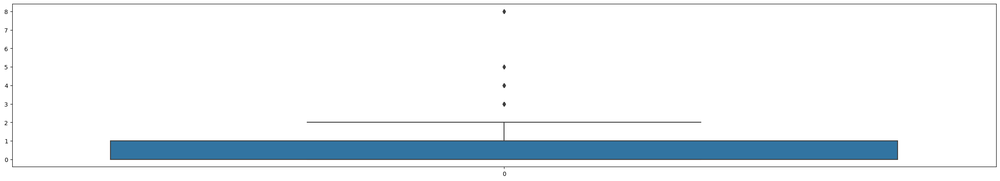

In [614]:
plt.figure(figsize=(30, 5))
sns.boxplot(df["sibsp"]);

(891, array([0, 1, 2, 5, 3, 4, 6]))

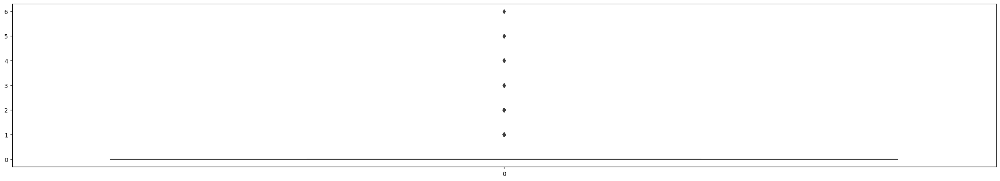

In [615]:
plt.figure(figsize=(30, 5))
sns.boxplot(df["parch"]);
df["parch"].count(), df["parch"].unique() 

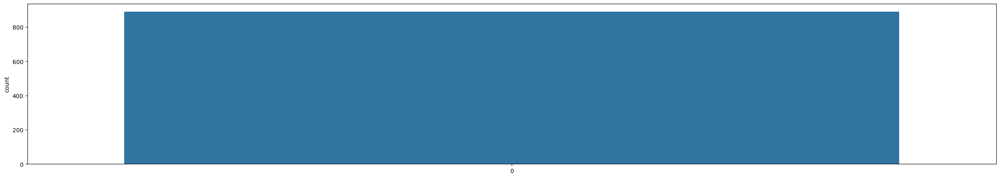

In [616]:
plt.figure(figsize=(30, 5))
sns.countplot(df["parch"]);

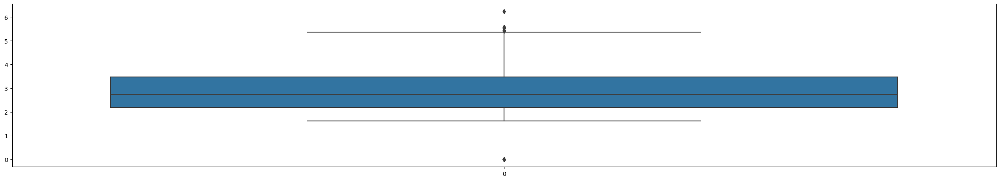

In [617]:
plt.figure(figsize=(30, 5))
sns.boxplot(df["fare"]);
#df["Credit_History"].count(), df["Credit_History"].unique() 

### IQR approach

- Note that
  - If you want to change a certain pertantage of the data for handling outliers.
    - You can adjust the ratio param forn  IQR_calculator funct to adjust inliar range.
  - If the ratio increate, 
    - outlier count will be reduce. Just the most outliers will be captured. 

#### Calculating IQR
- Calculates
  - __IQR__ pandas series for all the given variables
  - __l_th__ lower_threashold pandas series for all the given variables
  - __h_th__ higher_threashold pandas series for all the given variables

In [618]:
def IQR_calculator(df, ratio=1.5):
    # Calculating the quartiles
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    
    # IQR range calculation
    IQR = Q3 -Q1

    # Determinating the boundaries
    lower_threashold = Q1 - ratio * IQR
    higher_threashold = Q3 + ratio *IQR
    
    return IQR, lower_threashold, higher_threashold

In [619]:
IQR, l_th, h_th = IQR_calculator(df[num_cols], ratio=1.5)

In [620]:
from pprint import pprint
for i in [IQR, l_th, h_th]:
  print("-"*20)
  pprint(i)
  print("-"*20, end="\n"*2)

--------------------
survived     1.000000
pclass       1.000000
age         13.000000
sibsp        1.000000
parch        0.000000
fare         1.278518
dtype: float64
--------------------

--------------------
survived   -1.500000
pclass      0.500000
age         2.500000
sibsp      -1.500000
parch       0.000000
fare        0.269441
dtype: float64
--------------------

--------------------
survived     2.500000
pclass       4.500000
age         54.500000
sibsp        2.500000
parch        0.000000
fare         5.383513
dtype: float64
--------------------



### Finding out The outlier values
- Finds __is_outlier__ and __is_outlier_val__ dataframes which include boolean value for ever individual value.

In [621]:
def find_outlier_single(data:pd.DataFrame, lower_threashold:float, higher_threashold:float)->pd.DataFrame:
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df, df_num.columns

In [622]:
def find_outlier(df:pd.DataFrame, lower_threashold:pd.Series, higher_threashold:pd.Series)->pd.DataFrame:
    data = df[lower_threashold.index]
    boolean_outlier_df = (data < lower_threashold) | (higher_threashold < data)
    return boolean_outlier_df, df_num.columns

In [623]:
# Getting the outlier indexes
is_outlier, num_cols = find_outlier(df[num_cols], l_th, h_th)
is_outlier.head()

,survived,pclass,age,sibsp,parch,fare
0,False,False,False,False,False,False
1,False,False,False,False,False,False
2,False,False,False,False,False,False
3,False,False,False,False,False,False
4,False,False,False,False,False,False


In [624]:
is_outlier.sum()

survived      0
pclass        0
age          66
sibsp        46
parch       213
fare         31
dtype: int64

In [625]:
df["parch"].unique()

array([0, 1, 2, 5, 3, 4, 6])

In [626]:
is_outlier.sum() / df[is_outlier.columns].count()

survived    0.000000
pclass      0.000000
age         0.074074
sibsp       0.051627
parch       0.239057
fare        0.034792
dtype: float64

In [627]:
# determinating the variables which will be handle for avoiding outlier 
outlier_cols = ["age", "sibsp"]
is_outlier_val = is_outlier[outlier_cols]

In [628]:
is_outlier_val

,age,sibsp
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
...,...,...
886,False,False
887,False,False
888,False,False
889,False,False


In [629]:
df["age"][is_outlier_val["age"]].head()

7      2.0
11    58.0
15    55.0
16     2.0
33    66.0
Name: age, dtype: float64

In [630]:
age_outlier_indexs = df["age"][is_outlier_val["age"]].index
age_outlier_indexs[:5]

Int64Index([7, 11, 15, 16, 33], dtype='int64')

In [631]:
# Getting Outlier values
age_outlier_values = df[is_outlier_val].iloc[list(age_outlier_indexs)]#[is_outlier_val]
age_outlier_values[outlier_cols].head(10)

,age,sibsp
7,2.00,3.0
11,58.00,NaN
15,55.00,NaN
16,2.00,4.0
33,66.00,NaN
54,65.00,NaN
78,0.83,NaN
94,59.00,NaN
96,71.00,NaN
116,70.50,NaN


In [632]:
df["sibsp"][is_outlier_val["sibsp"]].head()

7     3
16    4
24    3
27    3
50    4
Name: sibsp, dtype: int64

In [633]:
sibsp_outlier_indexs = df["sibsp"][is_outlier_val["sibsp"]].index
sibsp_outlier_indexs[:5]

Int64Index([7, 16, 24, 27, 50], dtype='int64')

In [634]:
# Getting Outlier values
sibsp_outlier_values = df[is_outlier_val].iloc[list(sibsp_outlier_indexs)]#[is_outlier_val]
sibsp_outlier_values[outlier_cols].head(10)

,age,sibsp
7,2.0,3.0
16,2.0,4.0
24,NaN,3.0
27,NaN,3.0
50,NaN,4.0
59,NaN,5.0
63,NaN,3.0
68,NaN,4.0
71,NaN,5.0
85,NaN,3.0


### Handling outlier
- There are no outliers in the dataset, so no handling process is implemented

#### Util Functions

In [635]:
def mean_assignment(data:pd.Series, is_outlier:pd.Series, value:float):
  "It assigns given value to the outlier values"
  data[is_outlier] = value
  return data

# usage # df["c1"] = mean_assignment(df["c1"], is_outlier["c1"], df["c1"].mean()):

In [636]:
def boundary_casting(data:pd.Series, l_th:float, h_th:float):
  "It assigns border values to the outlier values"
  
  data[ data < l_th ] = l_th
  data[ h_th < data ] = h_th

  return data

#### Before

In [637]:
sibsp_outlier_values[outlier_cols].head(10)

,age,sibsp
7,2.0,3.0
16,2.0,4.0
24,NaN,3.0
27,NaN,3.0
50,NaN,4.0
59,NaN,5.0
63,NaN,3.0
68,NaN,4.0
71,NaN,5.0
85,NaN,3.0


In [638]:
age_outlier_values[outlier_cols].head(10)

,age,sibsp
7,2.00,3.0
11,58.00,NaN
15,55.00,NaN
16,2.00,4.0
33,66.00,NaN
54,65.00,NaN
78,0.83,NaN
94,59.00,NaN
96,71.00,NaN
116,70.50,NaN


#### Handling

In [639]:
for col in outlier_cols:
  print(f"{col:<20}: lower_th: {l_th[col]:<3.3},   higher_th: {h_th[col]:<10.3}")

age                 : lower_th: 2.5,   higher_th: 54.5      
sibsp               : lower_th: -1.5,   higher_th: 2.5       


In [640]:
for col in outlier_cols:
  df[col] = boundary_casting(df[col], l_th[col], h_th[col])

#### After

In [641]:
# Getting Outlier values
age_outlier_values_after = df[is_outlier_val].iloc[list(age_outlier_indexs)]#[is_outlier_val]
age_outlier_values_after[outlier_cols].head(10)

,age,sibsp
7,2.5,2.5
11,54.5,NaN
15,54.5,NaN
16,2.5,2.5
33,54.5,NaN
54,54.5,NaN
78,2.5,NaN
94,54.5,NaN
96,54.5,NaN
116,54.5,NaN


In [642]:
# Getting Outlier values
sibsp_outlier_values_after = df[is_outlier_val].iloc[list(sibsp_outlier_indexs)]#[is_outlier_val]
sibsp_outlier_values_after[outlier_cols].head(10)

,age,sibsp
7,2.5,2.5
16,2.5,2.5
24,NaN,2.5
27,NaN,2.5
50,NaN,2.5
59,NaN,2.5
63,NaN,2.5
68,NaN,2.5
71,NaN,2.5
85,NaN,2.5


# (D) Exploratory Data Analysis

## Dataset 

### Spesifications

In [643]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     891 non-null    int64   
 1   pclass       891 non-null    int64   
 2   sex          891 non-null    category
 3   age          891 non-null    float64 
 4   sibsp        891 non-null    float64 
 5   parch        891 non-null    int64   
 6   fare         891 non-null    float64 
 7   embarked     891 non-null    category
 8   class        891 non-null    category
 9   who          891 non-null    category
 10  adult_male   891 non-null    bool    
 11  embark_town  891 non-null    category
 12  alive        891 non-null    category
 13  alone        891 non-null    bool    
dtypes: bool(2), category(6), float64(3), int64(3)
memory usage: 49.6 KB


In [644]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
survived,891.0,0.383838,0.486592,0.0,0.000000,0.000000,1.000000,1.000000
pclass,891.0,2.308642,0.836071,1.0,2.000000,3.000000,3.000000,3.000000
age,891.0,29.376817,12.062035,2.5,22.000000,29.699118,35.000000,54.500000
sibsp,891.0,0.426487,0.708246,0.0,0.000000,0.000000,1.000000,2.500000
parch,891.0,0.381594,0.806057,0.0,0.000000,0.000000,0.000000,6.000000
fare,891.0,2.962246,0.969048,0.0,2.187218,2.737881,3.465736,6.240917


In [645]:
pd.unique(df.select_dtypes(include=["category"]).values.ravel('k'))

array(['male', 'female', 'S', 'C', 'Q', 'Third', 'First', 'Second', 'man',
       'woman', 'child', 'Southampton', 'Cherbourg', 'Queenstown', 'no',
       'yes'], dtype=object)

### Temporary encoding

In [646]:
encoded_df = df.copy()

In [647]:
for col in encoded_df.select_dtypes(include= ["category"]):
  encoded_df[col] = encoded_df[col].cat.codes

In [648]:
for col in encoded_df.select_dtypes(include=[bool]):
  encoded_df[col] = encoded_df[col].astype(int)

In [649]:
encoded_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   survived     891 non-null    int64  
 1   pclass       891 non-null    int64  
 2   sex          891 non-null    int8   
 3   age          891 non-null    float64
 4   sibsp        891 non-null    float64
 5   parch        891 non-null    int64  
 6   fare         891 non-null    float64
 7   embarked     891 non-null    int8   
 8   class        891 non-null    int8   
 9   who          891 non-null    int8   
 10  adult_male   891 non-null    int64  
 11  embark_town  891 non-null    int8   
 12  alive        891 non-null    int8   
 13  alone        891 non-null    int64  
dtypes: float64(3), int64(5), int8(6)
memory usage: 61.0 KB


## Univariate Analysis

In [650]:
num_cols = df.select_dtypes(include=("int64","float64"), exclude=("bool") ).columns
cat_cols = df.select_dtypes(exclude=("int64","float64")).columns

In [651]:
num_cols

Index(['survived', 'pclass', 'age', 'sibsp', 'parch', 'fare'], dtype='object')

In [652]:
len(df.columns), df.columns

(14,
 Index(['survived', 'pclass', 'sex', 'age', 'sibsp', 'parch', 'fare',
        'embarked', 'class', 'who', 'adult_male', 'embark_town', 'alive',
        'alone'],
       dtype='object'))

In [653]:
df[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   sex          891 non-null    category
 1   embarked     891 non-null    category
 2   class        891 non-null    category
 3   who          891 non-null    category
 4   adult_male   891 non-null    bool    
 5   embark_town  891 non-null    category
 6   alive        891 non-null    category
 7   alone        891 non-null    bool    
dtypes: bool(2), category(6)
memory usage: 7.8 KB


In [654]:
df[num_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   survived  891 non-null    int64  
 1   pclass    891 non-null    int64  
 2   age       891 non-null    float64
 3   sibsp     891 non-null    float64
 4   parch     891 non-null    int64  
 5   fare      891 non-null    float64
dtypes: float64(3), int64(3)
memory usage: 41.9 KB


### Target Variable

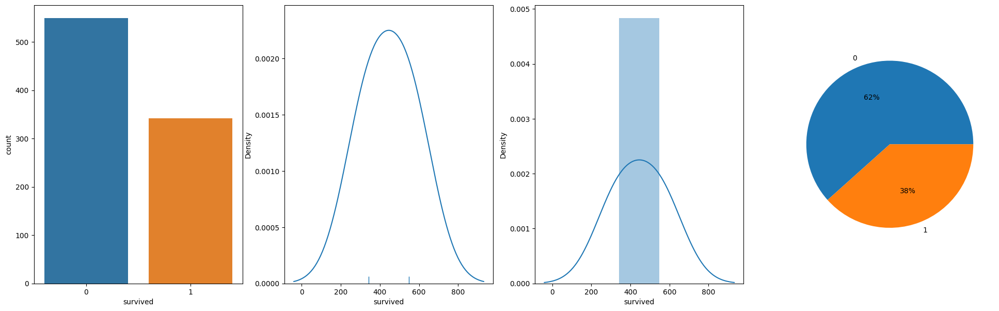

In [655]:
target_var = "survived"

plt.figure(figsize=(24,7))

plt.subplot(1,4,1)
sns.countplot(data=df, x=target_var);

plt.subplot(1,4,2)
sns.distplot(df[target_var].value_counts(), rug=True, hist=False);

plt.subplot(1,4,3)
sns.distplot(df[target_var].value_counts(), rug=False, hist=True);

plt.subplot(1,4,4)
plt.pie(df[target_var].value_counts(), labels=df[target_var].unique(), autopct="%.0f%%");

### Feature Variables [Numerical]

#### setting the plotting params

In [656]:
# Defining the params
target_var = "survived"
#num_cols = df.select_dtypes(exclude='category').columns
num_col_size = len(num_cols)
cols, rows = (3, num_col_size//3 + 1) if num_col_size > 5 else (5, 1) 
figsize = (cols*7, rows*5)

#### [histplot] Distributions

In [657]:
num_cols

Index(['survived', 'pclass', 'age', 'sibsp', 'parch', 'fare'], dtype='object')

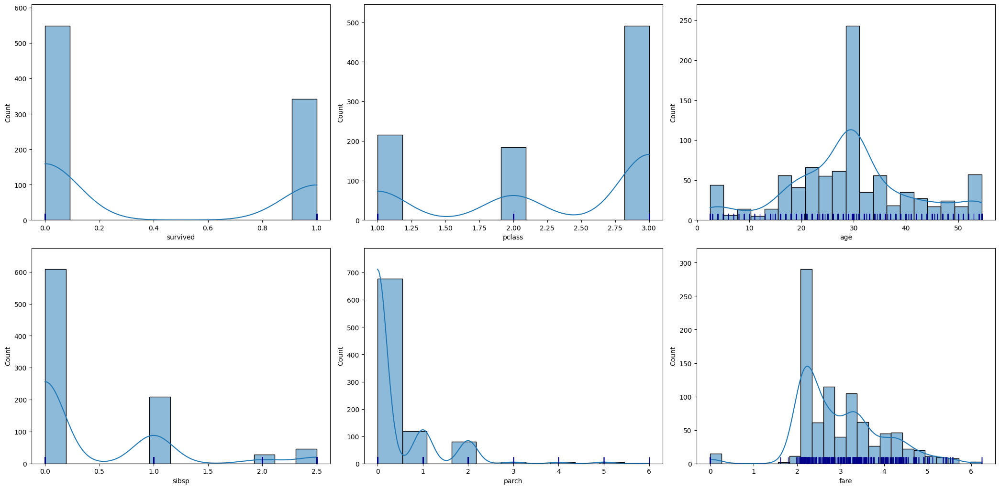

In [658]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.histplot(x=df[col], data=df, kde=True, ax=ax)
    sns.rugplot(x=df[col], data=df, height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

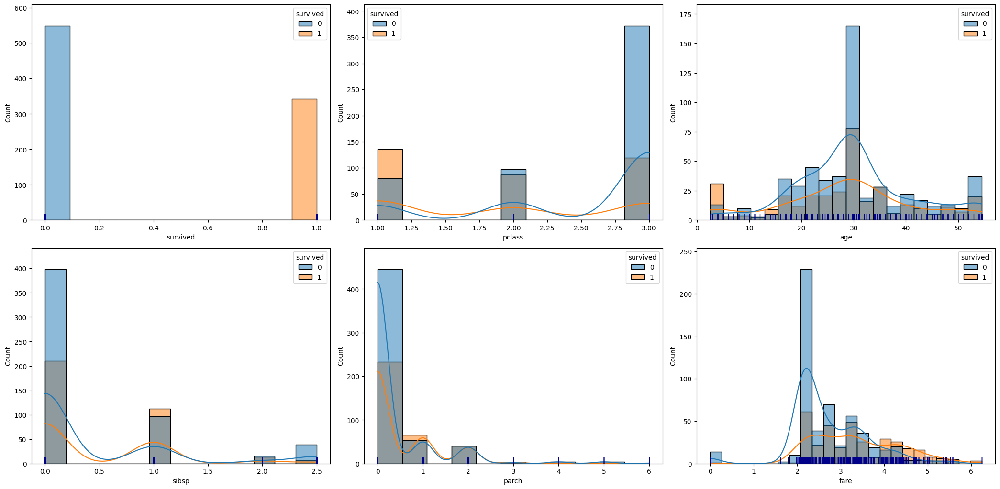

In [659]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.histplot(x=df[col], data=df, hue=df[target_var],kde=True, ax=ax)
    sns.rugplot(x=df[col], data=df, height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

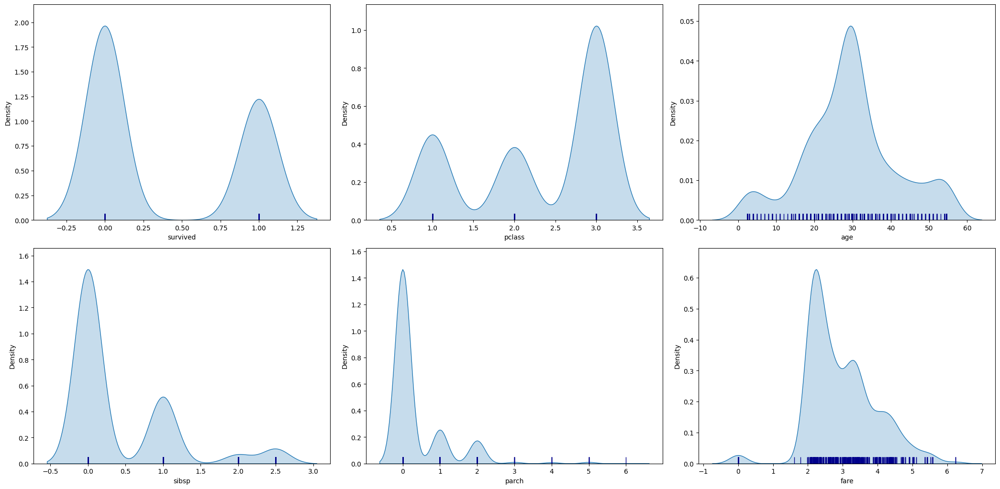

In [660]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.kdeplot(x=df[col], data=df ,shade=True, ax=ax)
    sns.rugplot(x=df[col], data=df, height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

#### [boxplot] Distributions with quartiles (Outlier)

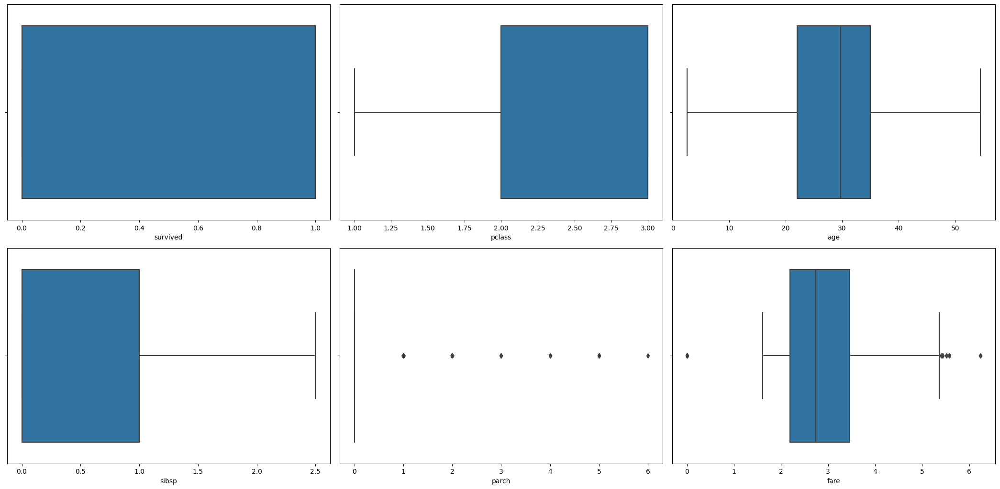

In [661]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.boxplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

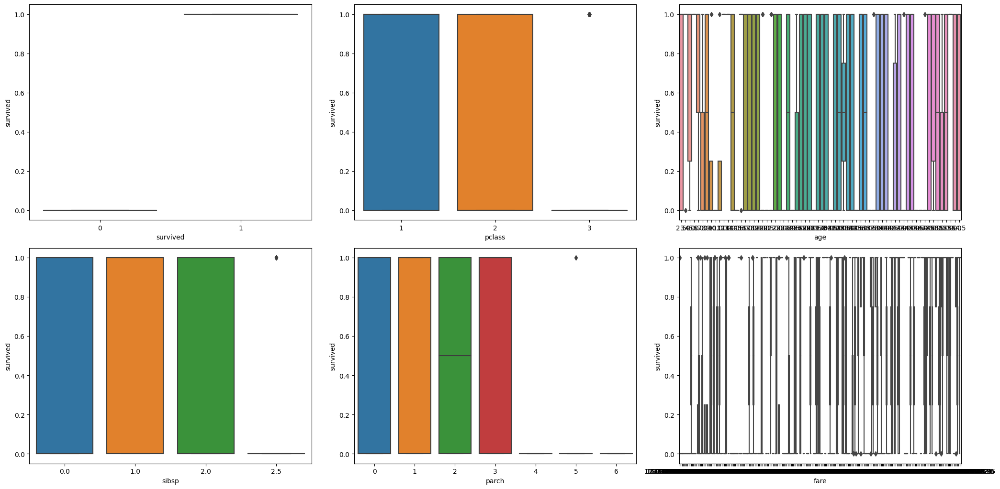

In [662]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.boxplot(x=df[col], y=df[target_var], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [violinplot] Distributions with quartiles and density

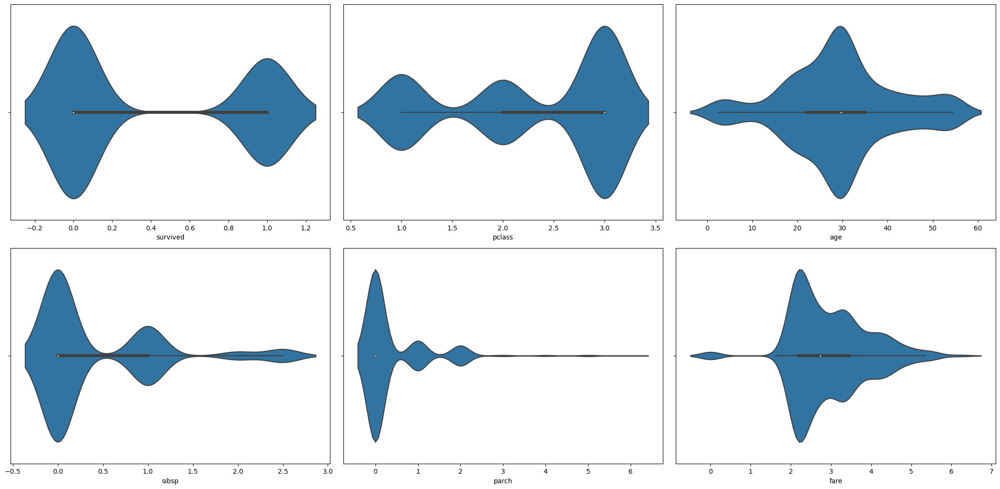

In [663]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # violinplot
    sns.violinplot(x=df[col], show_medians=True, ax=ax)
    
fig.tight_layout()  
plt.show()

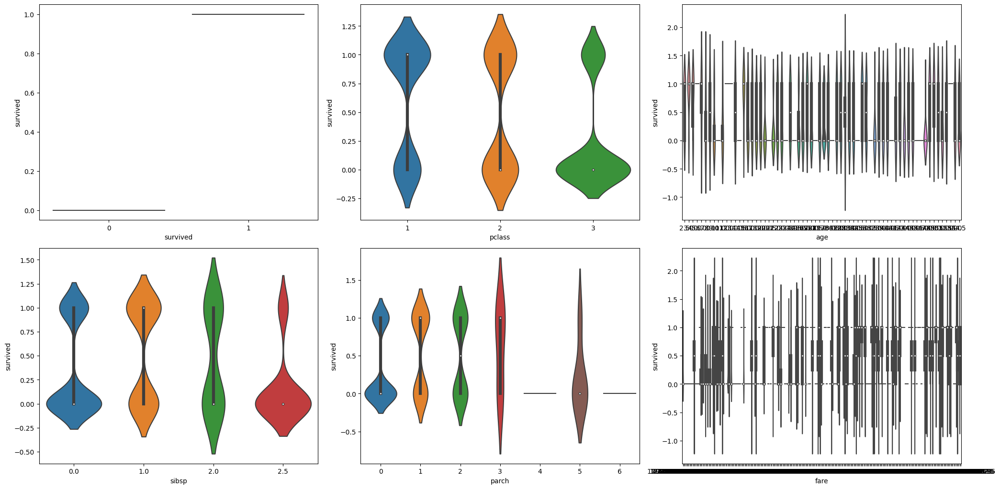

In [664]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # violinplot
    sns.violinplot(x=df[col], y=df[target_var], show_medians=True, ax=ax)
    
fig.tight_layout()  
plt.show()

#### [stripplot] spread of the data with stripplot

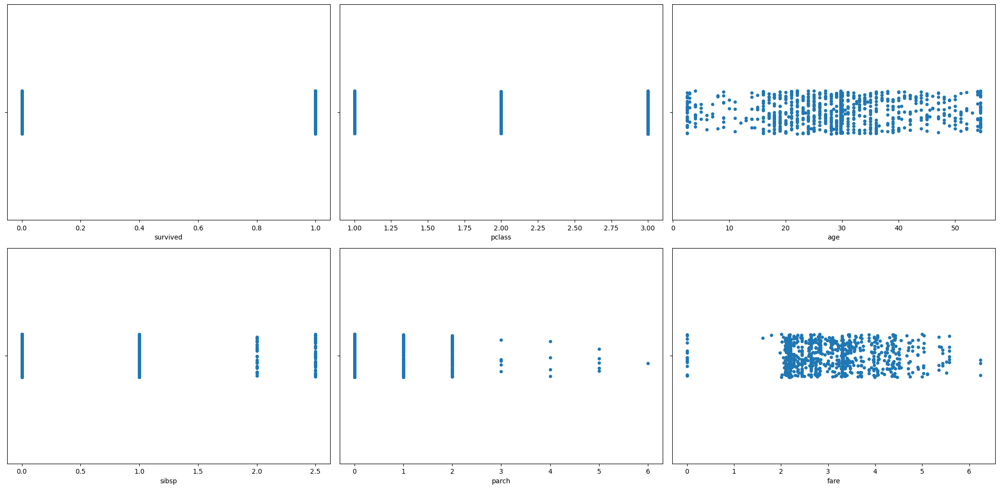

In [665]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # stripplot
    sns.stripplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

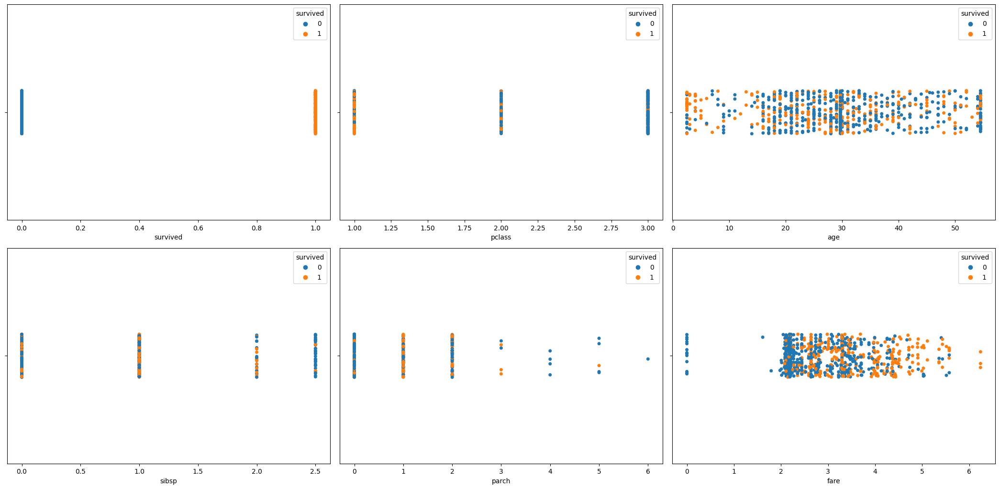

In [666]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # stripplot
    sns.stripplot(x=df[col], hue=df[target_var] ,ax=ax)
    
fig.tight_layout()  
plt.show()

#### [swarmplot] spread of the data with stripplot (avoids overlap)

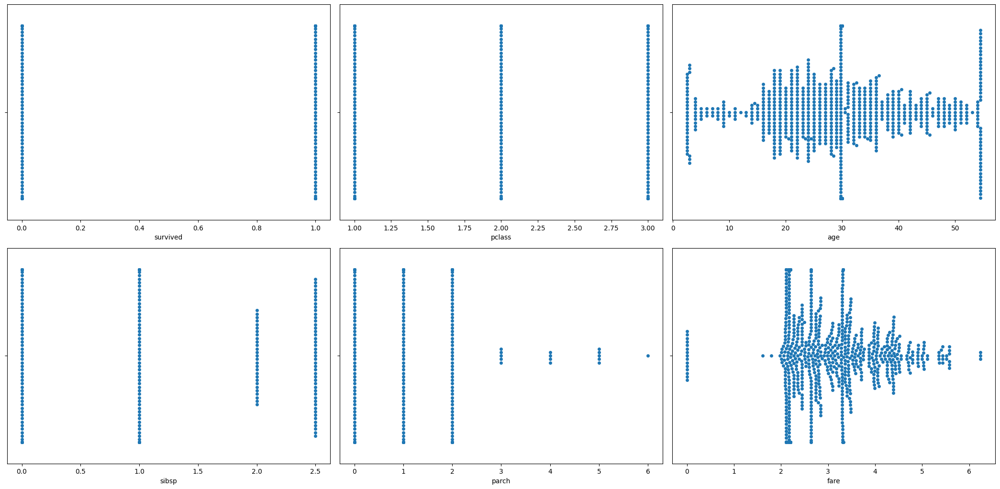

In [667]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # swarmplot
    sns.swarmplot(x=df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

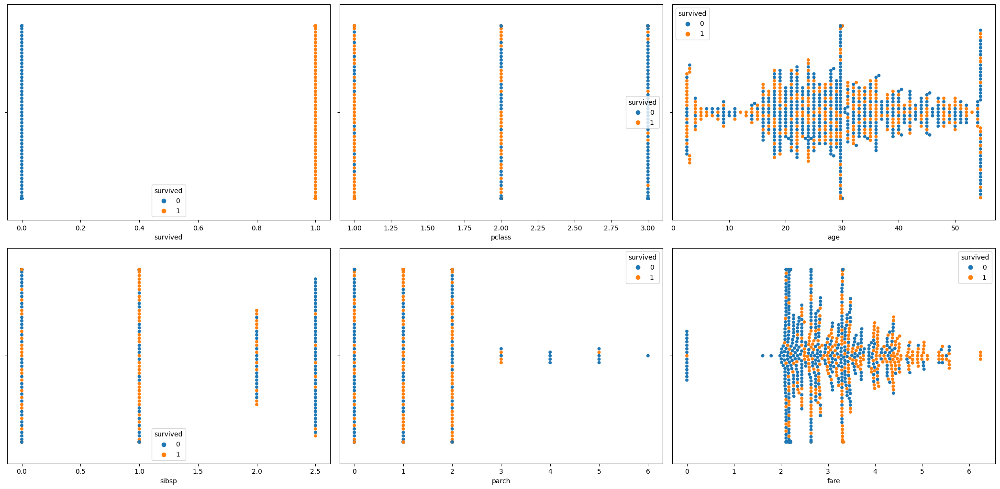

In [668]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # swarmplot
    sns.swarmplot(x=df[col], hue=df[target_var], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [scatterplot] Spread of data 

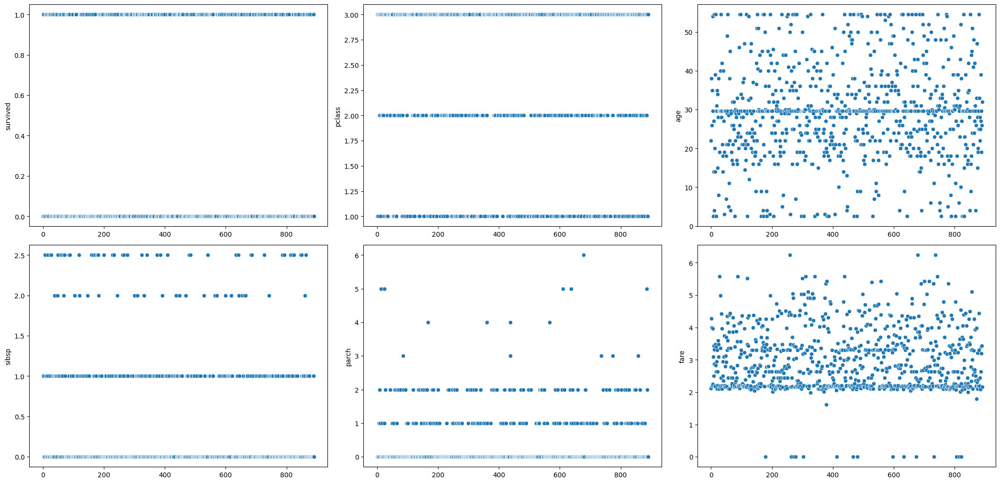

In [669]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # scatterplot
    sns.scatterplot(x = df[col].index, y= df[col], ax=ax)
    
fig.tight_layout()  
plt.show()

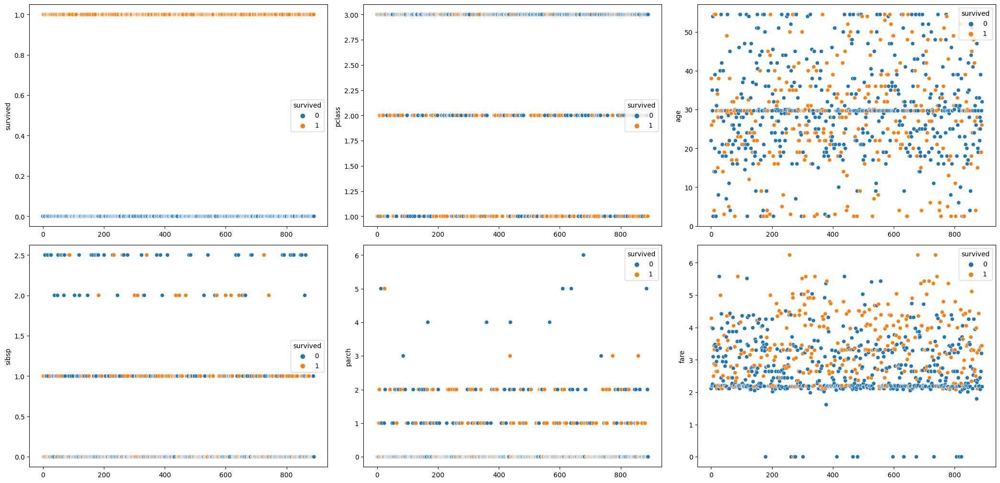

In [670]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)

    sns.scatterplot(x = df[col].index, y= df[col], hue=df[target_var], ax=ax)
    
fig.tight_layout()  
plt.show()

#### [lineplot] Trend

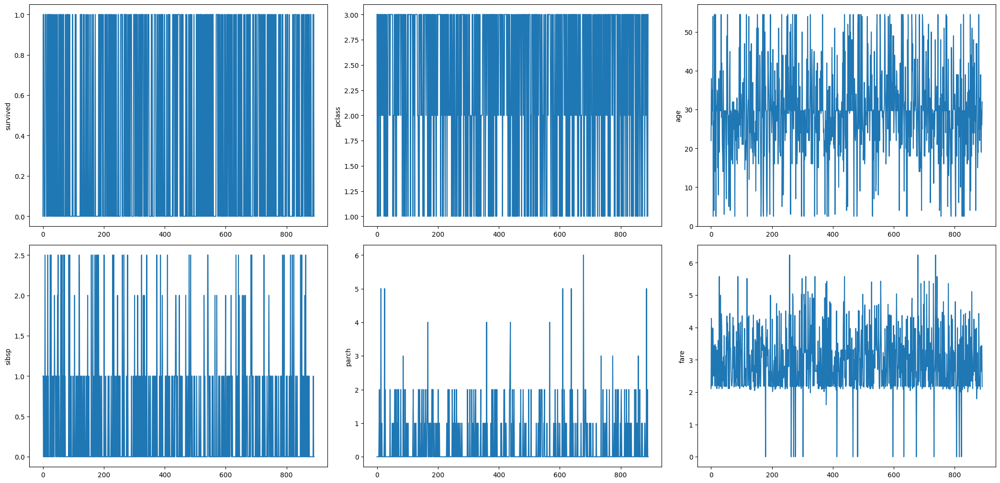

In [671]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.lineplot(x=df[col].index, y=df[col], ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

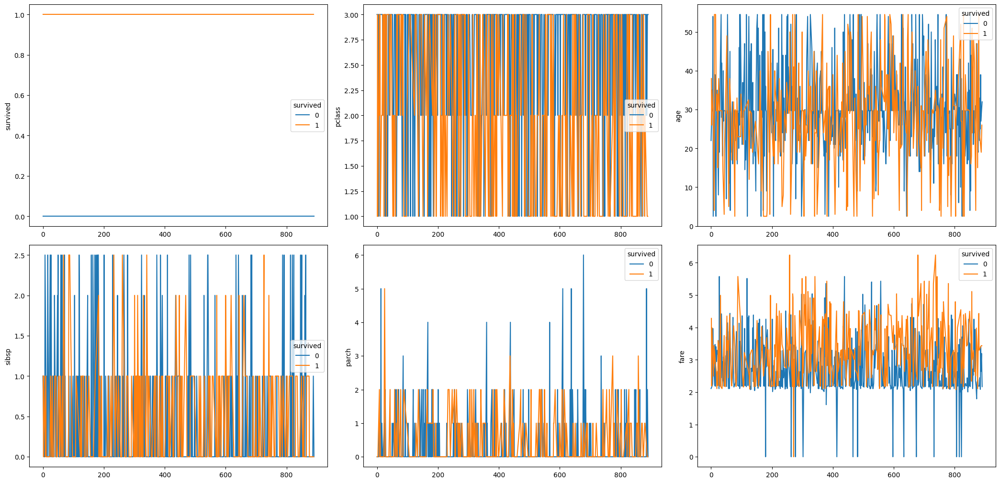

In [672]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(num_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.lineplot(x=df[col].index, y=df[col], hue=df[target_var], ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

### Feature Variables [Categorical]

#### setting the plotting params

In [673]:
# Defining the params
target_var = "survived"
#num_cols = df.select_dtypes(exclude='category').columns
cat_col_size = len(cat_cols)
cols, rows = (3, cat_col_size//3 + 1) if cat_col_size > 5 else (5, 1) 
figsize = (cols*7, rows*5)

In [674]:
cat_cols

Index(['sex', 'embarked', 'class', 'who', 'adult_male', 'embark_town', 'alive',
       'alone'],
      dtype='object')

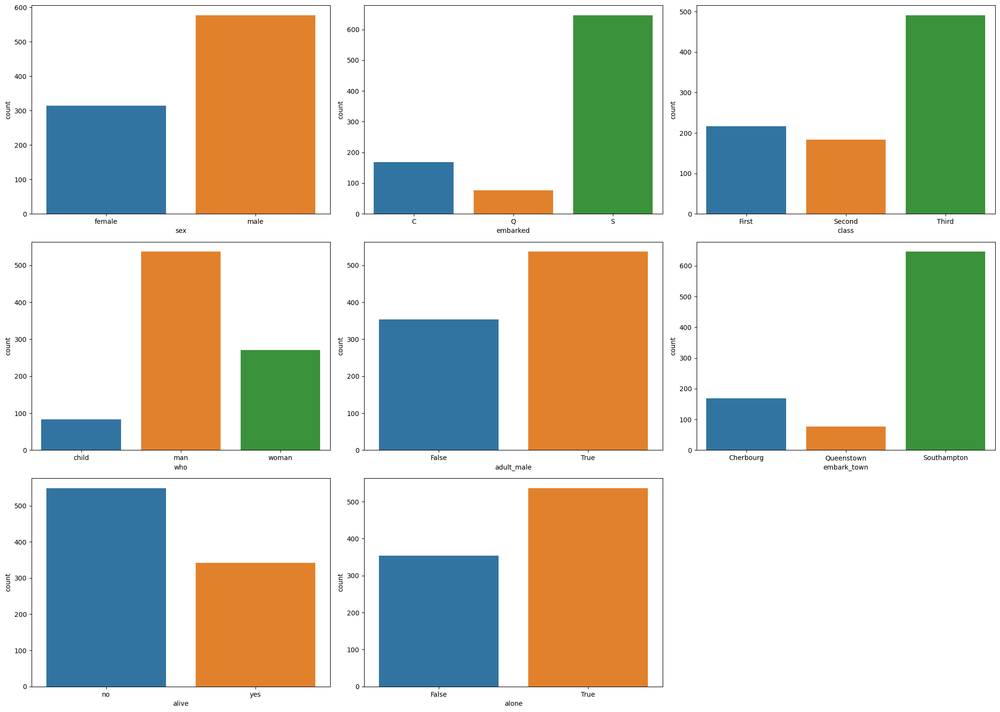

In [675]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(cat_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.countplot(x=df[col], ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

In [676]:
cat_cols

Index(['sex', 'embarked', 'class', 'who', 'adult_male', 'embark_town', 'alive',
       'alone'],
      dtype='object')

In [677]:
cat_cols = ['sex', 'embarked', 'class', 'who', "adult_male", "embark_town", "alive", "alone"]

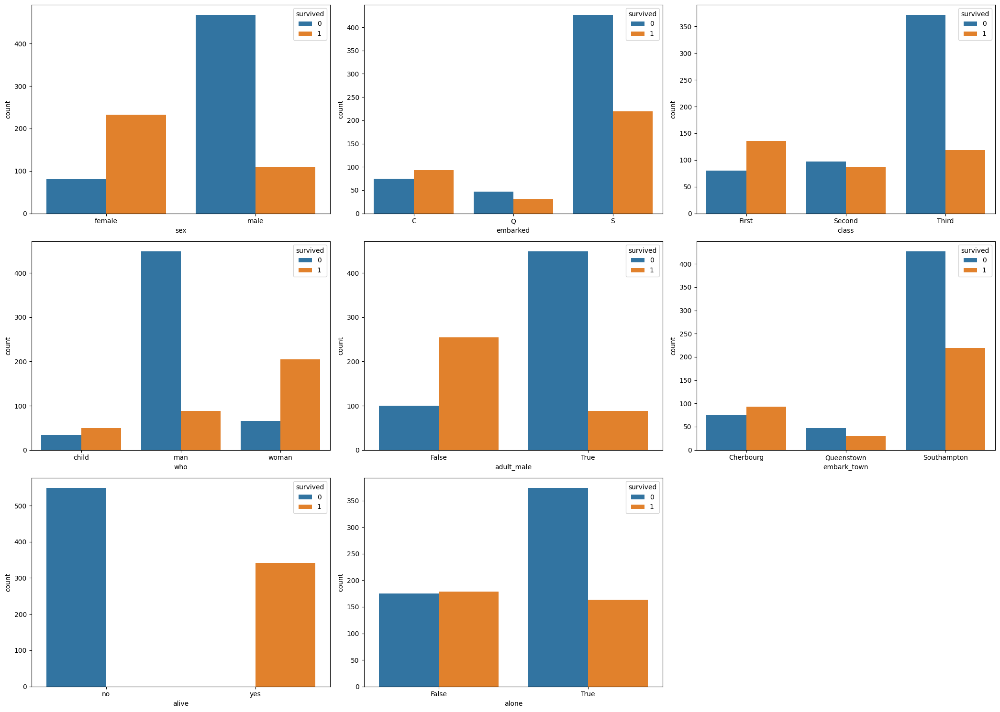

In [678]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(cat_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    sns.countplot(x=df[col], hue=df[target_var], ax=ax)
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

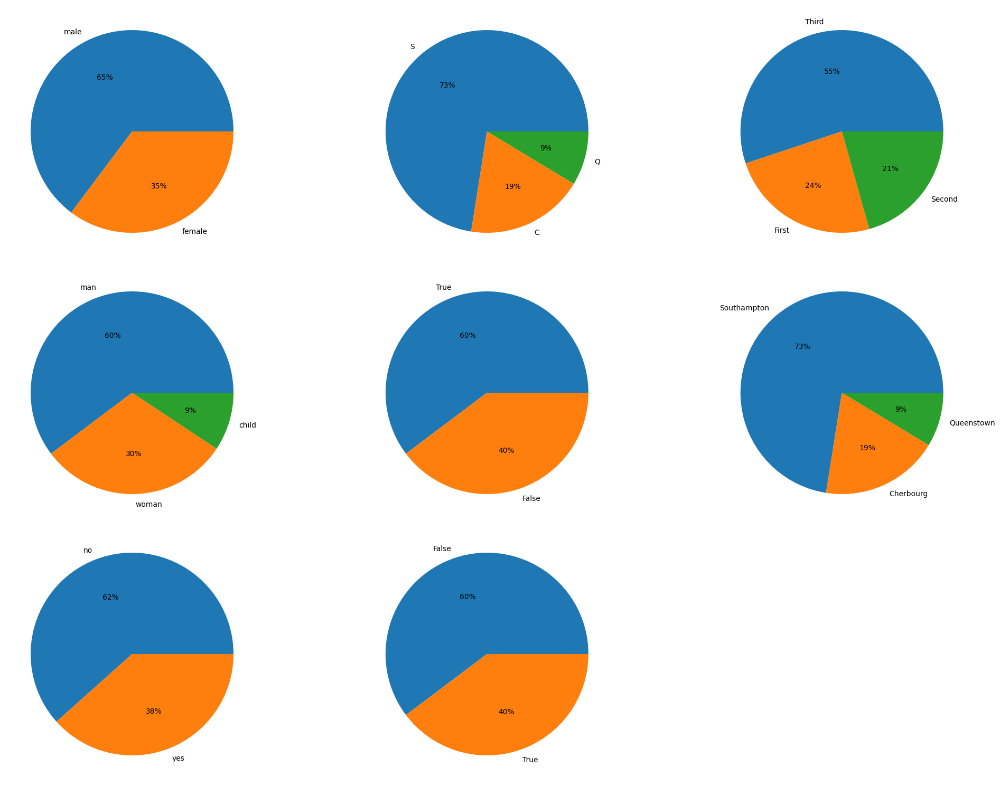

In [679]:
fig = plt.figure(figsize=figsize)
for i, col in enumerate(cat_cols):
    
    # creating new axis for plotting
    ax=fig.add_subplot( rows, cols, i+1)
    
    # boxplot
    plt.pie(df[col].value_counts(), labels=df[col].unique(), autopct="%.0f%%");
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)
    
fig.tight_layout()  
plt.show()

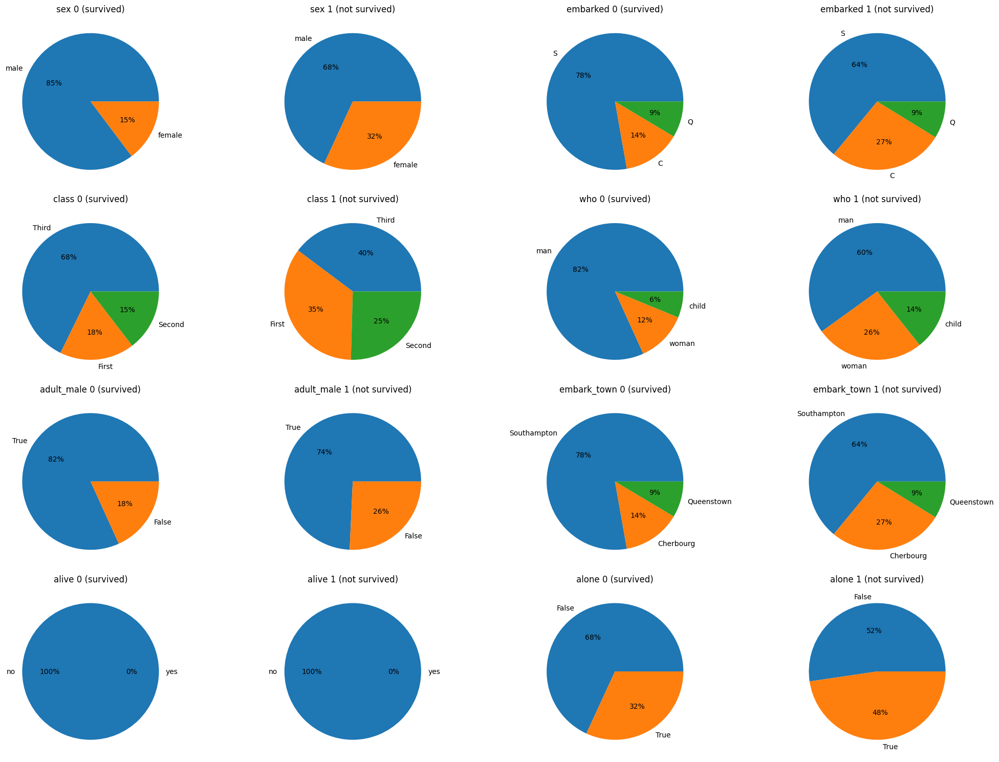

In [680]:
from itertools import count
fig = plt.figure(figsize=figsize)
for i, col in zip(count(step=2),cat_cols):

    if col == target_var: continue

    # creating new axis for plotting
    ax=fig.add_subplot(4, 4, i+1)#( rows, cols, i+1)
  
    # boxplot
    plt.pie(df[col][df[target_var]==0].value_counts(), labels=df[col].unique(), autopct="%.0f%%");
    plt.title(col + " 0 (survived)")
    #sns.scatterplot(x = df[col].index, y= df[col], hue=df["species"], ax=ax)

    ax=fig.add_subplot(4, 4, i+2)#( rows, cols, i+2)
    plt.pie(df[col][df[target_var]==1].value_counts(), labels=df[col].unique(), autopct="%.0f%%");
    plt.title(col + " 1 (not survived)")
    
fig.tight_layout()  
plt.show()

## Bivariate & Multivariate Analysis

In [681]:
num_cols

Index(['survived', 'pclass', 'age', 'sibsp', 'parch', 'fare'], dtype='object')

In [682]:
cat_cols

['sex',
 'embarked',
 'class',
 'who',
 'adult_male',
 'embark_town',
 'alive',
 'alone']

In [683]:
len(df.columns) == (len(num_cols) + len(cat_cols))

True

In [684]:
#plt.figure(figsize=(10,5))

#plt.subplot(1,2,1)
#sns.scatterplot(df["alive"], df[target_var])

#plt.subplot(1,2,2)
#sns.heatmap(df[["alive","survived"]].corr(), annot=True,cmap='Blues')

In [685]:
#sns.JointGrid(df["fare"], df["age"]).plot(sns.scatterplot, sns.histplot);

In [686]:
#sns.JointGrid(df["fare"], df["age"], hue=df[target_var]).plot(sns.scatterplot, sns.histplot);

In [687]:
#sns.JointGrid(df["fare"], df[target_var]).plot(sns.scatterplot, sns.histplot);

In [688]:
#sns.JointGrid(df["fare"], df["pclass"]).plot(sns.scatterplot, sns.histplot);

In [689]:
#sns.JointGrid(df["fare"], df["pclass"], hue=df[target_var]).plot(sns.scatterplot, sns.histplot);

In [690]:
#sns.JointGrid(df["age"], df["sex"], hue=df[target_var]).plot(sns.scatterplot, sns.histplot);

In [691]:
#sns.JointGrid(df["age"], df[target_var]).plot(sns.scatterplot, sns.kdeplot);

In [692]:
#sns.JointGrid(df["pclass"], df["age"], hue=df[target_var]).plot(sns.scatterplot, sns.histplot);

In [693]:
#sns.JointGrid(df["pclass"], df["who"], hue=df[target_var]).plot(sns.scatterplot, sns.histplot);

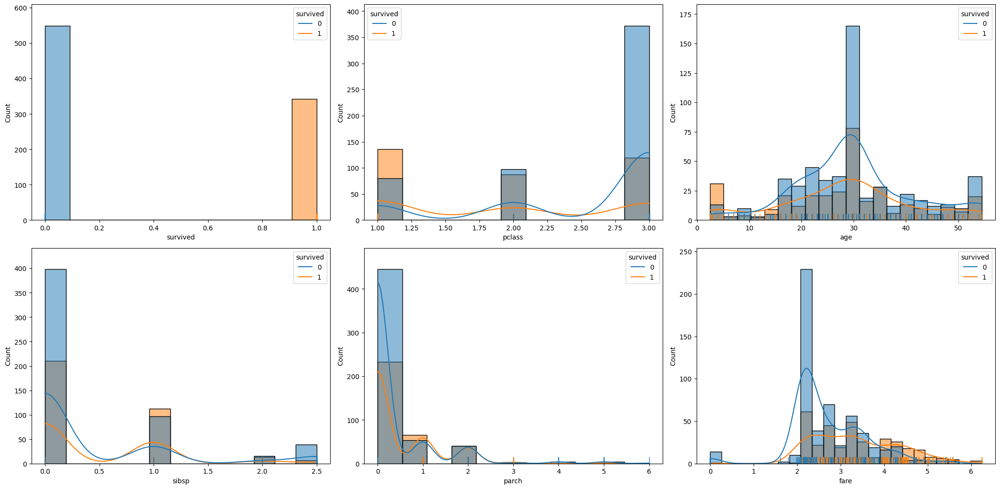

In [694]:
fig = plt.figure( figsize=figsize)
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.histplot(x=df[col], data=df, hue=df[target_var], kde=True, ax=ax)
    sns.rugplot(x=df[col], data=df, hue=df[target_var], height=.03, color='darkblue', ax=ax)
    
fig.tight_layout()  
plt.show()

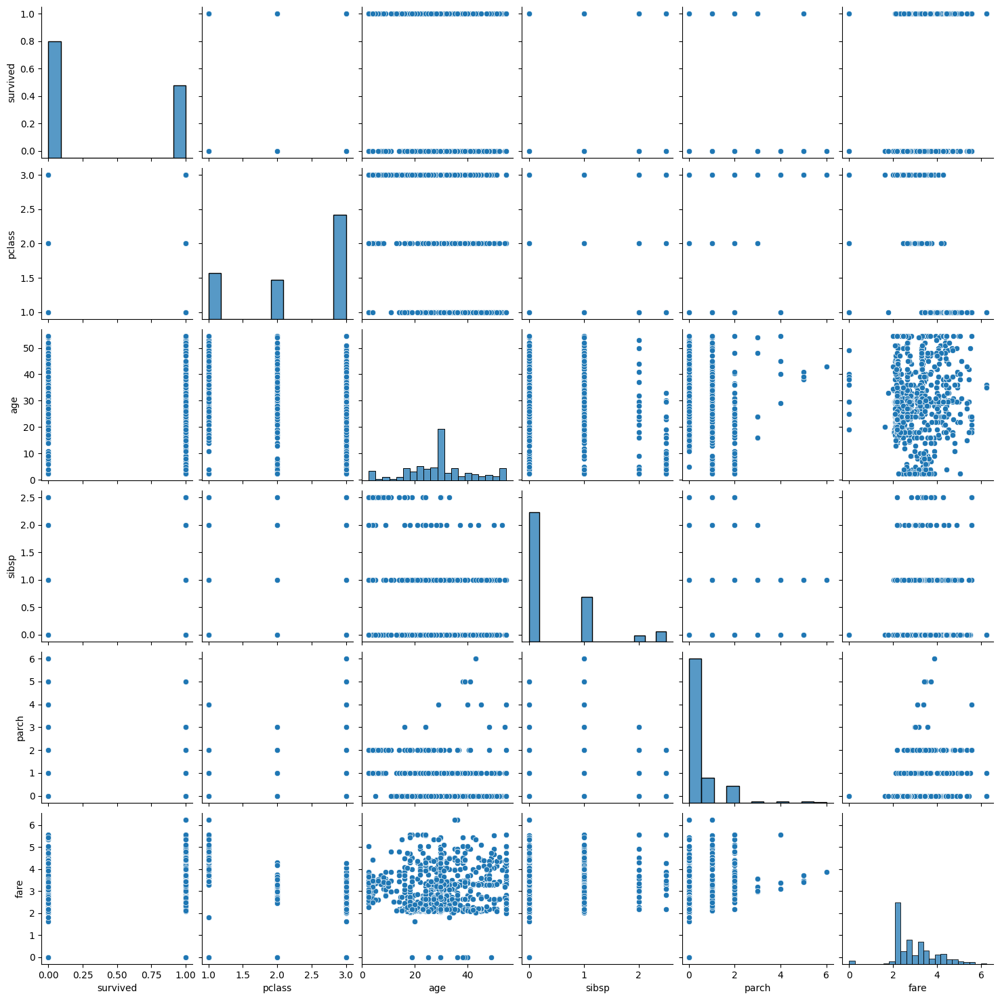

In [695]:
sns.pairplot(df[num_cols]);

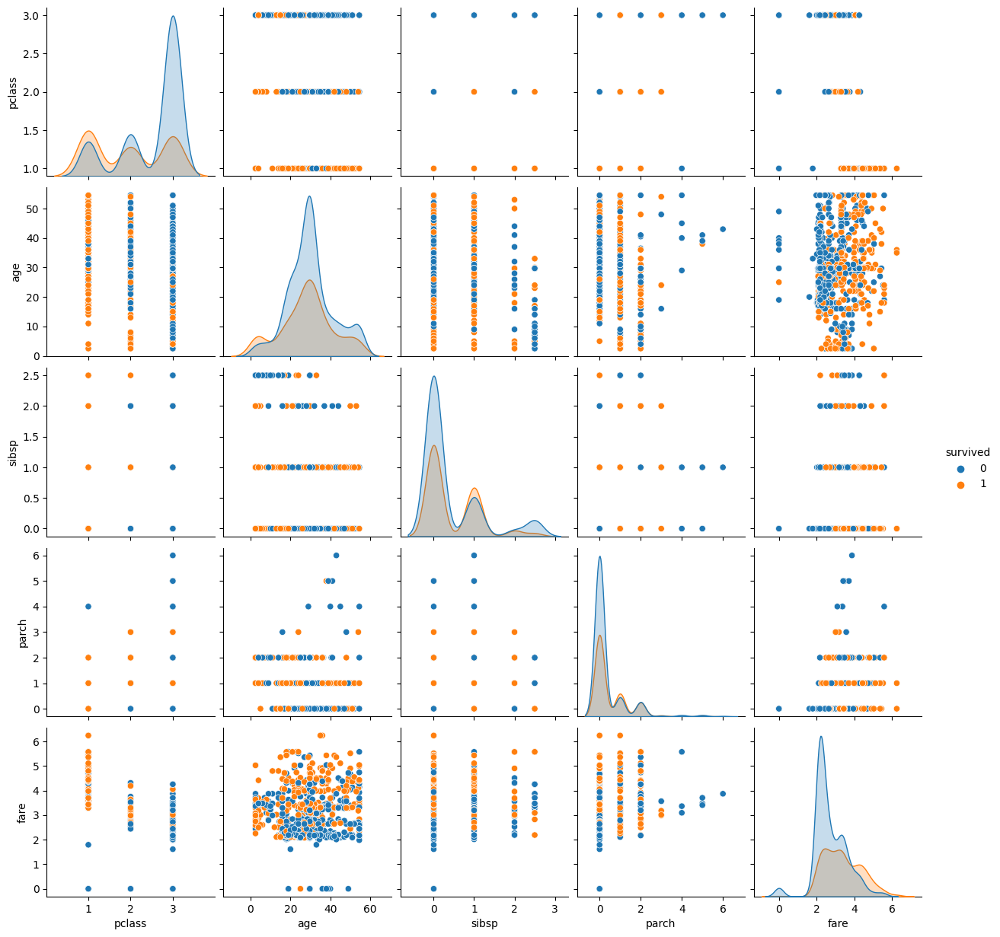

In [696]:
sns.pairplot(df[num_cols], hue=target_var);

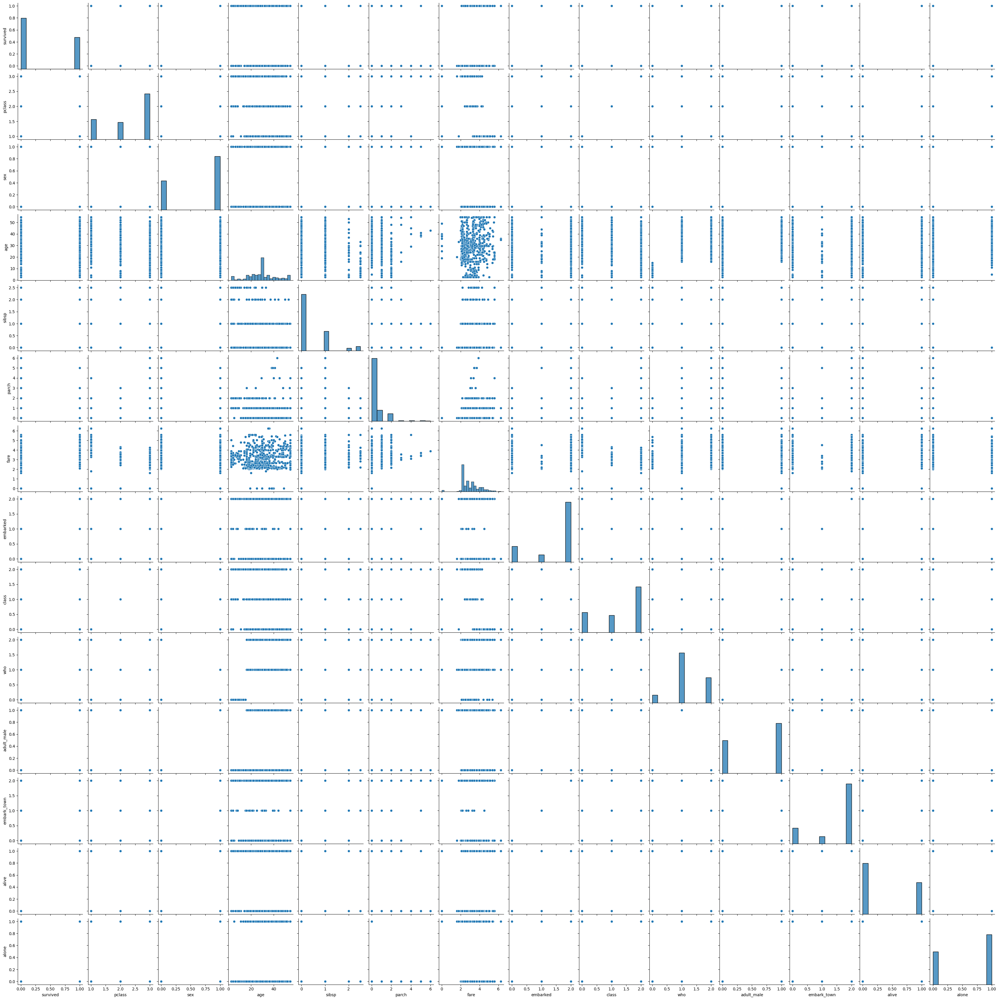

In [134]:
sns.pairplot(encoded_df);

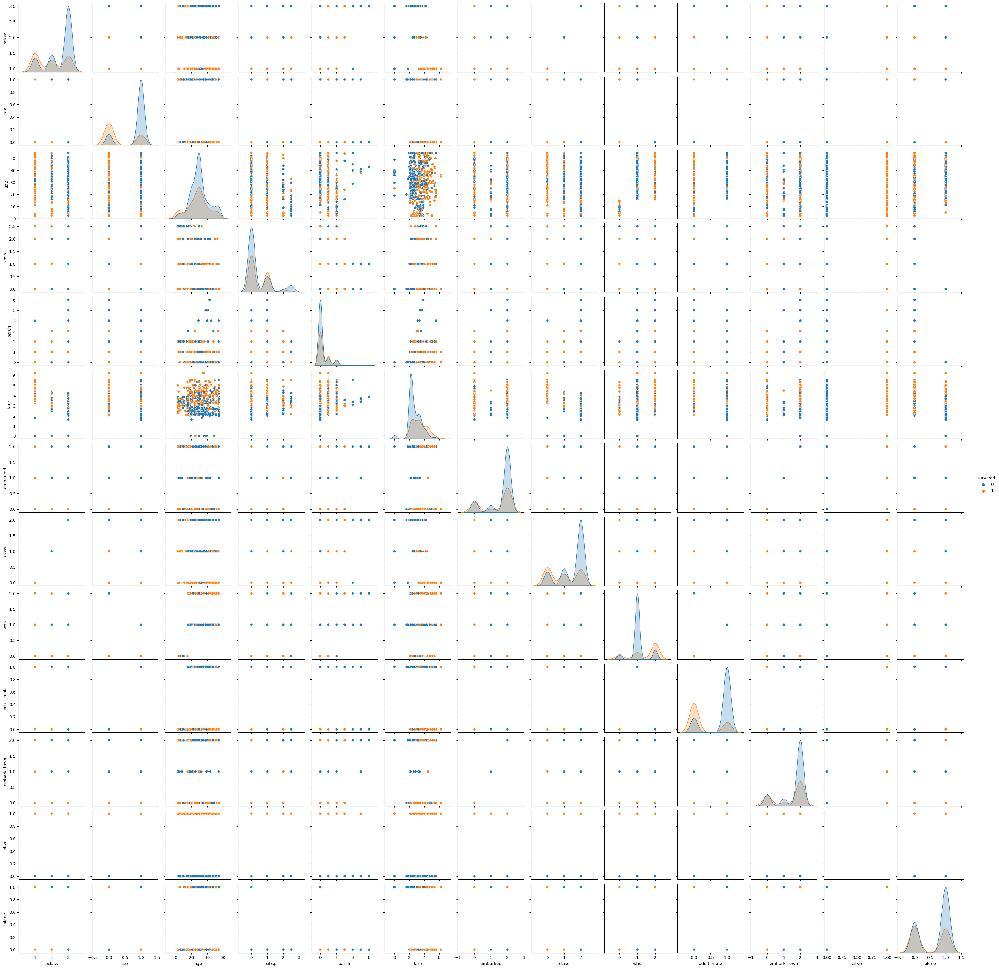

In [135]:
sns.pairplot(encoded_df, hue=target_var);

<Figure size 2000x2000 with 0 Axes>

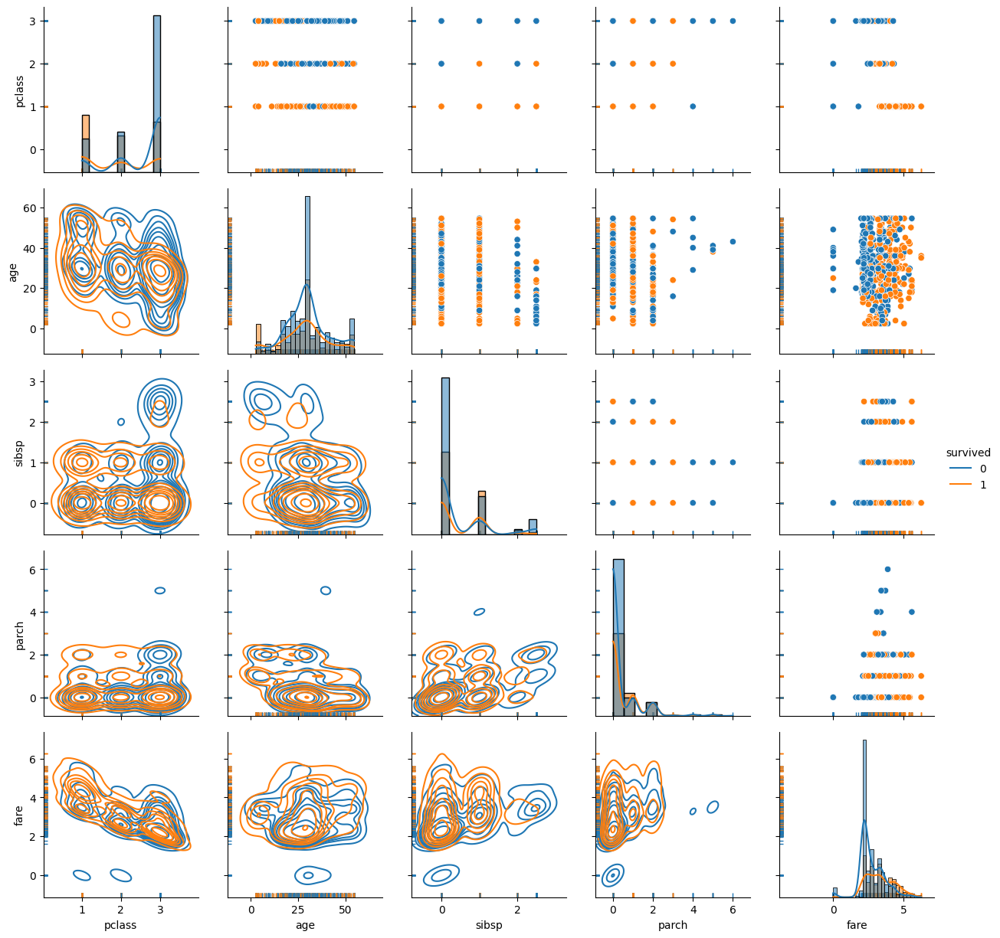

In [136]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(df.select_dtypes(exclude=[bool]), diag_sharey=False, hue=target_var)
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.kdeplot)
g.map(sns.rugplot);
g.add_legend();

<Figure size 2000x2000 with 0 Axes>

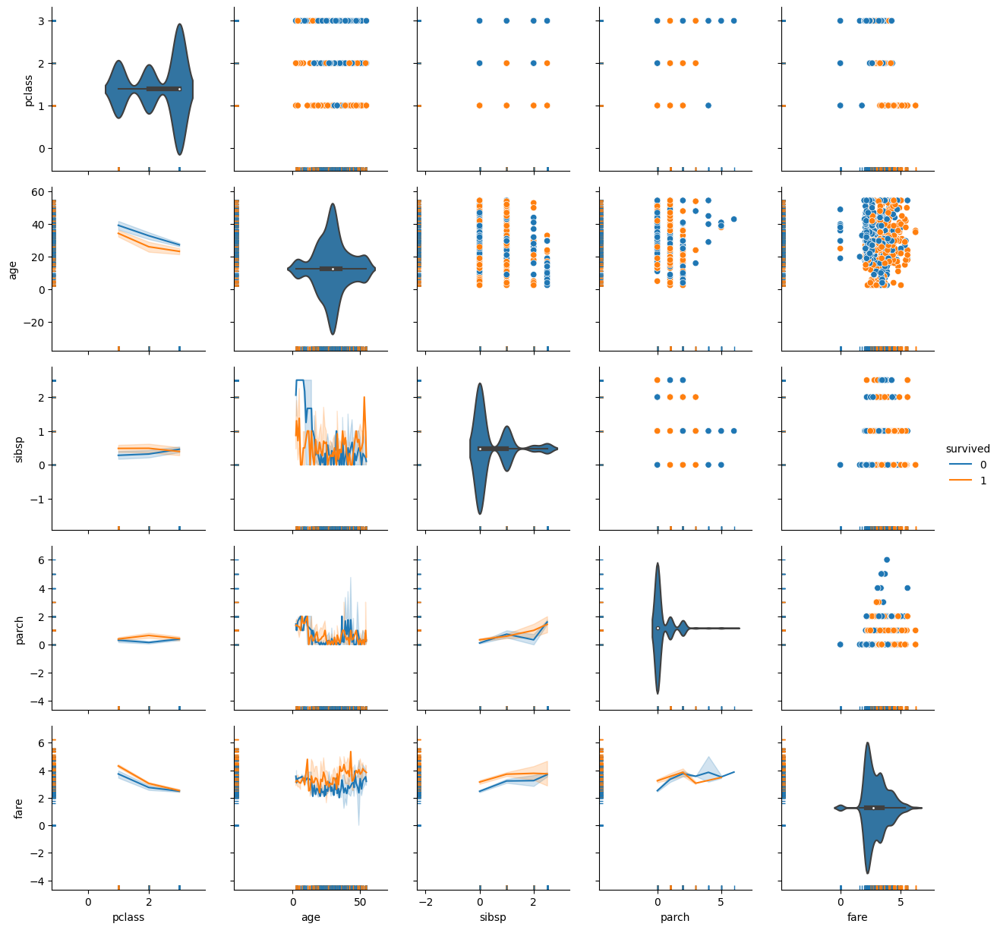

In [137]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(df.select_dtypes(exclude=[bool]), diag_sharey=False, hue=target_var)
g.map_upper(sns.scatterplot)
g.map_diag(sns.violinplot)
g.map_lower(sns.lineplot)
g.map(sns.rugplot)
g.add_legend();

<Figure size 2000x2000 with 0 Axes>

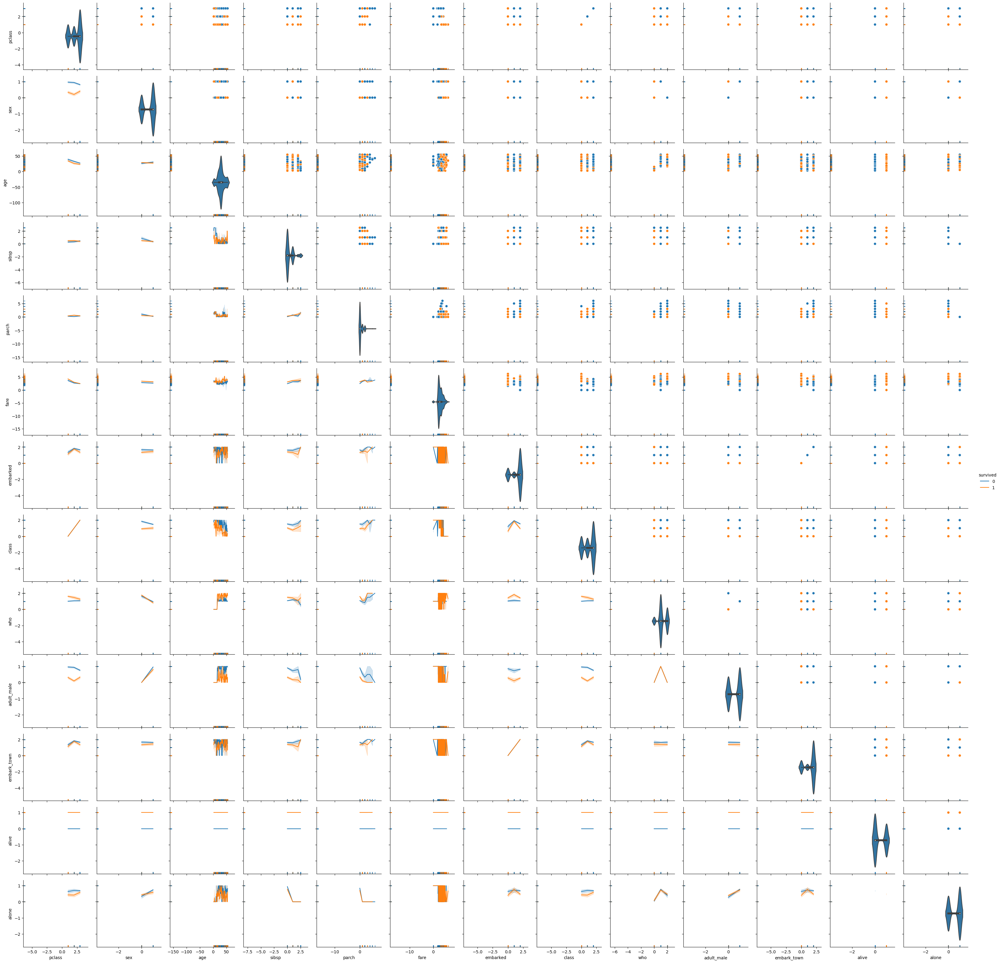

In [138]:
plt.figure(figsize=(20,20))

# Create a PairGrid instance
g = sns.PairGrid(encoded_df, hue=target_var)
g.map_upper(sns.scatterplot)
g.map_diag(sns.violinplot)
g.map_lower(sns.lineplot)
g.map(sns.rugplot)
g.add_legend();

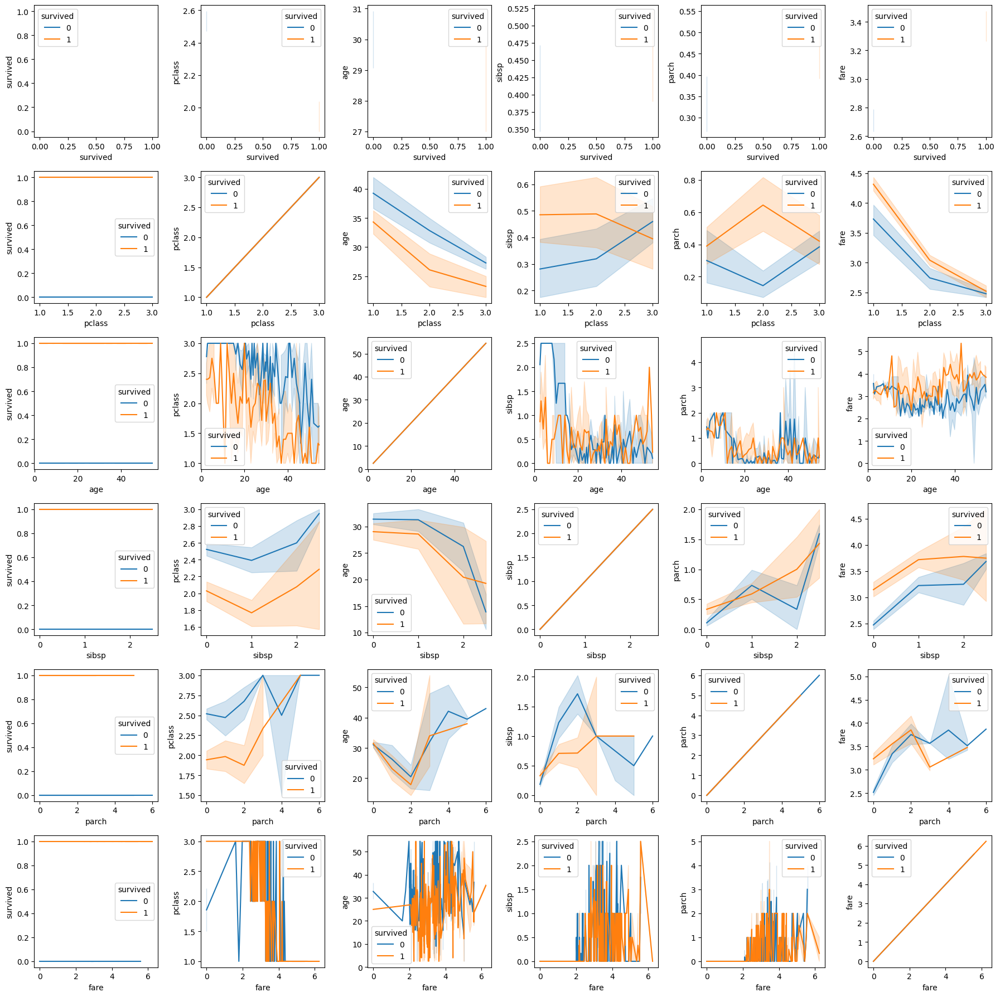

In [139]:
row_size, col_size = len(num_cols), len(num_cols)
fig = plt.figure( figsize=(row_size*3, row_size*3))
for i, row in enumerate(num_cols):
    for j, col in enumerate(num_cols):
        ax=fig.add_subplot(row_size, col_size, (i*col_size)+j+1)
        sns.lineplot(data= df, x=row, y=col, hue=target_var, ax=ax)
        
fig.tight_layout()  
plt.show()

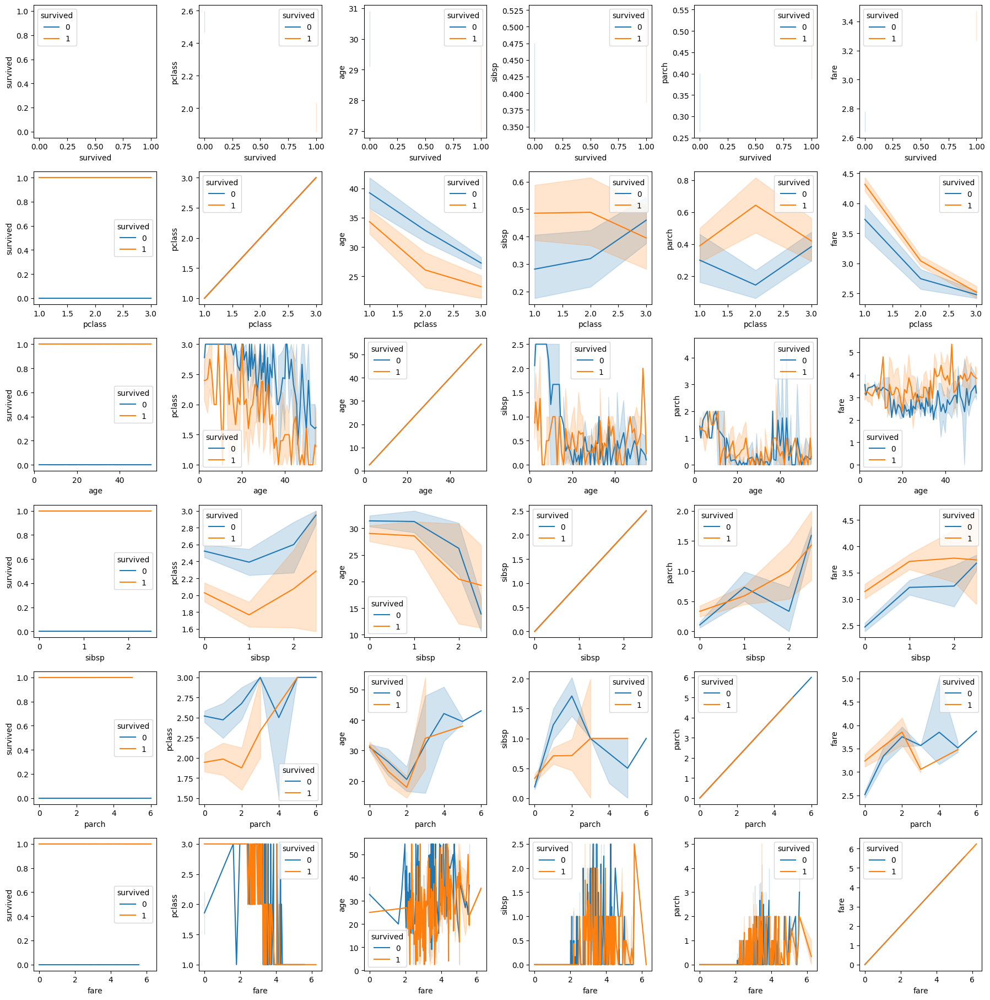

In [140]:
row_size = col_size = len(encoded_df.columns)
fig = plt.figure( figsize=(row_size*3, row_size*3))
for i, row in enumerate(num_cols):
    for j, col in enumerate(num_cols):
        ax=fig.add_subplot(row_size, col_size, (i*col_size)+j+1)
        sns.lineplot(data= encoded_df, x=row, y=col, hue=target_var, ax=ax)
        
fig.tight_layout()  
plt.show()

## Relations

### Correlation

In [141]:
df.corr()

,survived,pclass,age,sibsp,parch,fare,adult_male,alone
survived,1.000000,-0.338481,-0.065857,0.031434,0.081629,0.329862,-0.557080,-0.203367
pclass,-0.338481,1.000000,-0.330962,0.023180,0.018443,-0.661022,0.094035,0.135207
age,-0.065857,-0.330962,1.000000,-0.251585,-0.186087,0.100383,0.254530,0.179911
sibsp,0.031434,0.023180,-0.251585,1.000000,0.409366,0.365081,-0.306275,-0.742081
parch,0.081629,0.018443,-0.186087,0.409366,1.000000,0.332186,-0.349943,-0.583398
fare,0.329862,-0.661022,0.100383,0.365081,0.332186,1.000000,-0.295684,-0.478410
adult_male,-0.557080,0.094035,0.254530,-0.306275,-0.349943,-0.295684,1.000000,0.404744
alone,-0.203367,0.135207,0.179911,-0.742081,-0.583398,-0.478410,0.404744,1.000000


<Axes: >

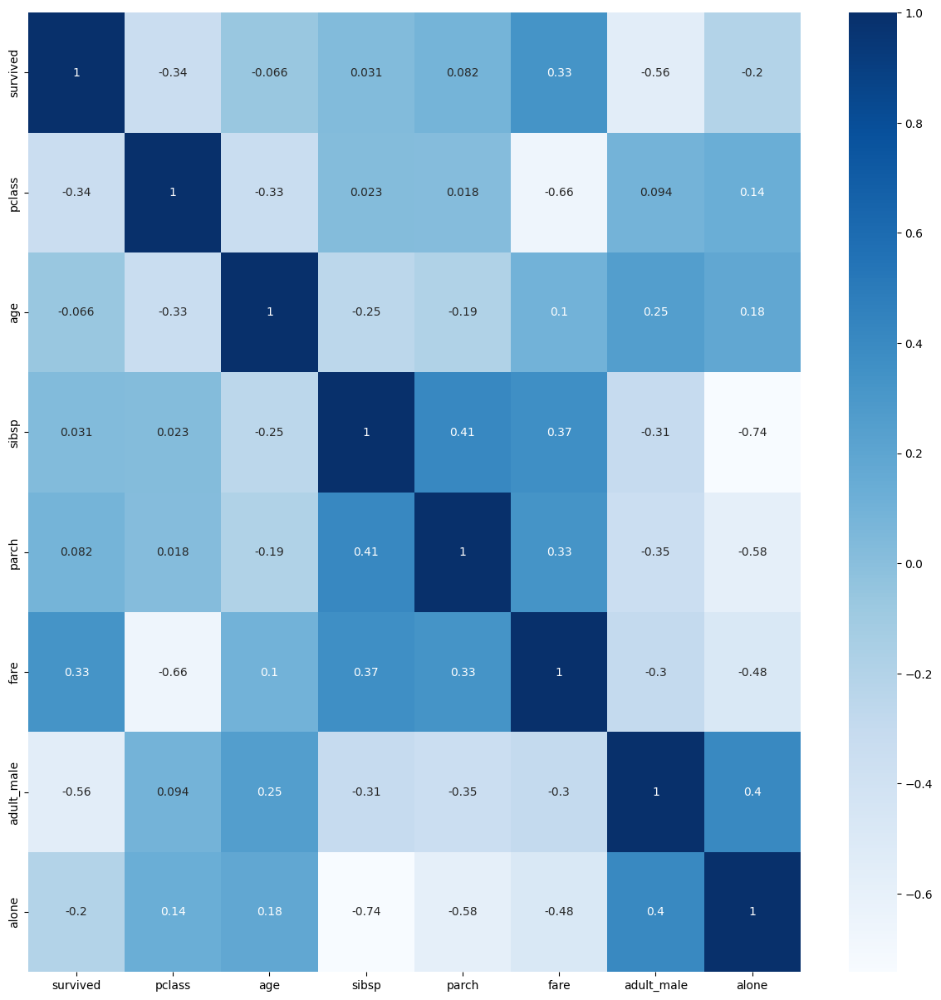

In [142]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(), annot=True, cmap='Blues')

<Axes: >

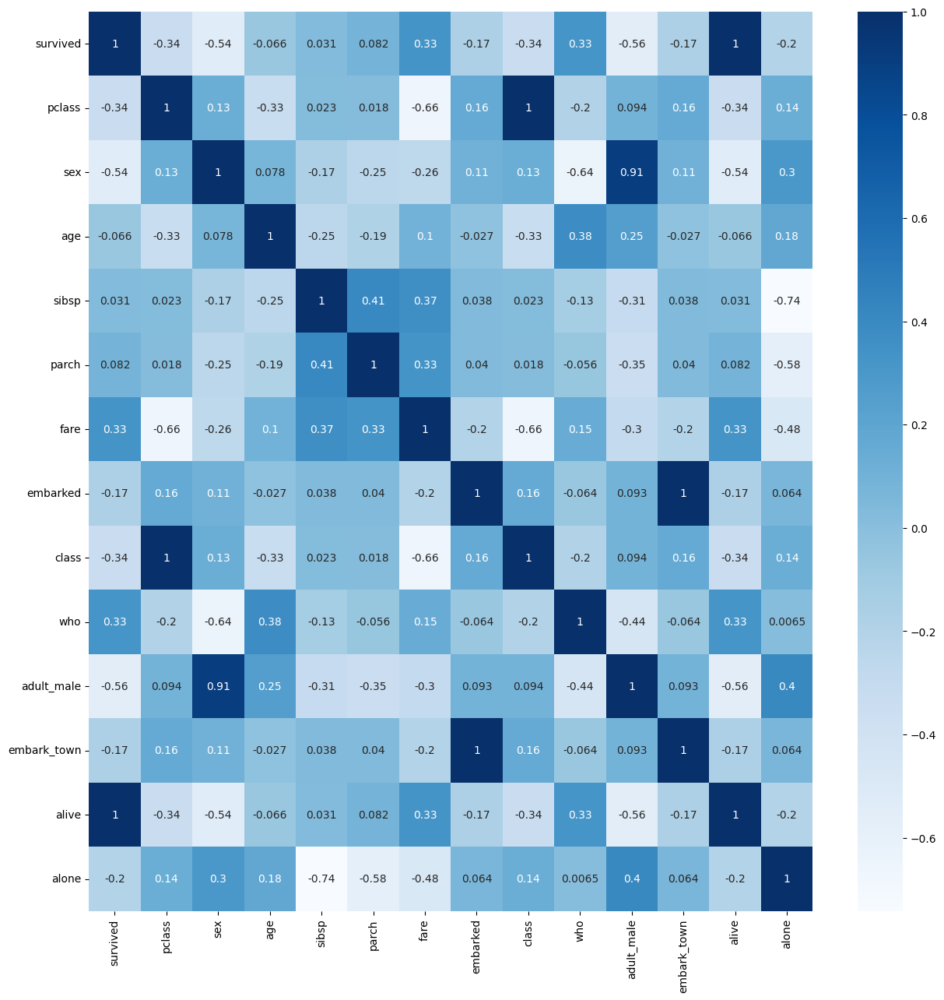

In [143]:
plt.figure(figsize=(15,15))
sns.heatmap(encoded_df.corr(), annot=True, cmap='Blues')

<Axes: >

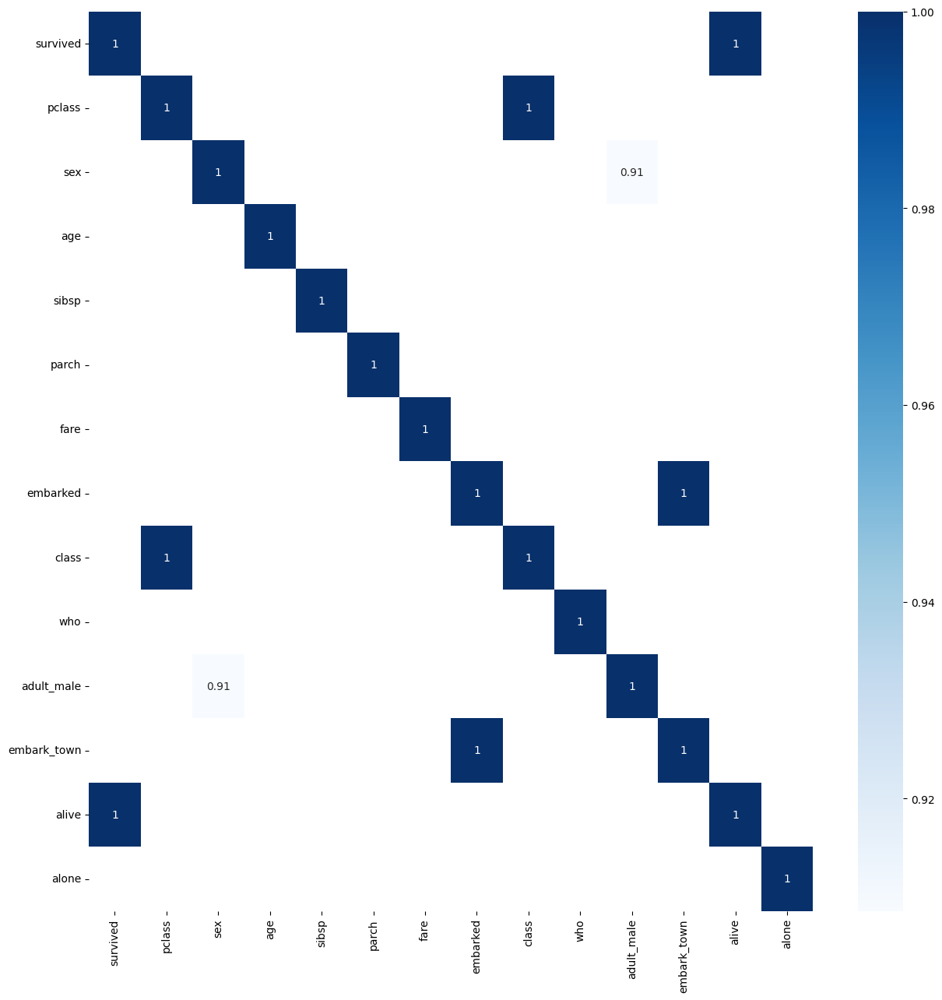

In [144]:
plt.figure(figsize=(15,15))
th = 0.7
sns.heatmap(encoded_df.corr()[encoded_df.corr() > th], annot=True, cmap='Blues')

In [145]:
high_corr_vars = [
    ("alive", "survived"),
    ("pclass", "class"),
    ("embark_town", "embarked"),
    ("adult_male", "sex")
]

In [146]:
print("-"*70)
for c1, c2 in high_corr_vars:
  print(f"{c1:<25}  {list(df[c1].unique())}")
  print(f"{c2:<25}  {list(df[c1].unique())}")
  print("-"*70)

----------------------------------------------------------------------
alive                      ['no', 'yes']
survived                   ['no', 'yes']
----------------------------------------------------------------------
pclass                     [3, 1, 2]
class                      [3, 1, 2]
----------------------------------------------------------------------
embark_town                ['Southampton', 'Cherbourg', 'Queenstown']
embarked                   ['Southampton', 'Cherbourg', 'Queenstown']
----------------------------------------------------------------------
adult_male                 [True, False]
sex                        [True, False]
----------------------------------------------------------------------


### Variances

In [147]:
df.var().sort_values(ascending=False)

age           145.492694
fare            0.939055
pclass          0.699015
parch           0.649728
sibsp           0.501612
adult_male      0.239723
alone           0.239723
survived        0.236772
dtype: float64

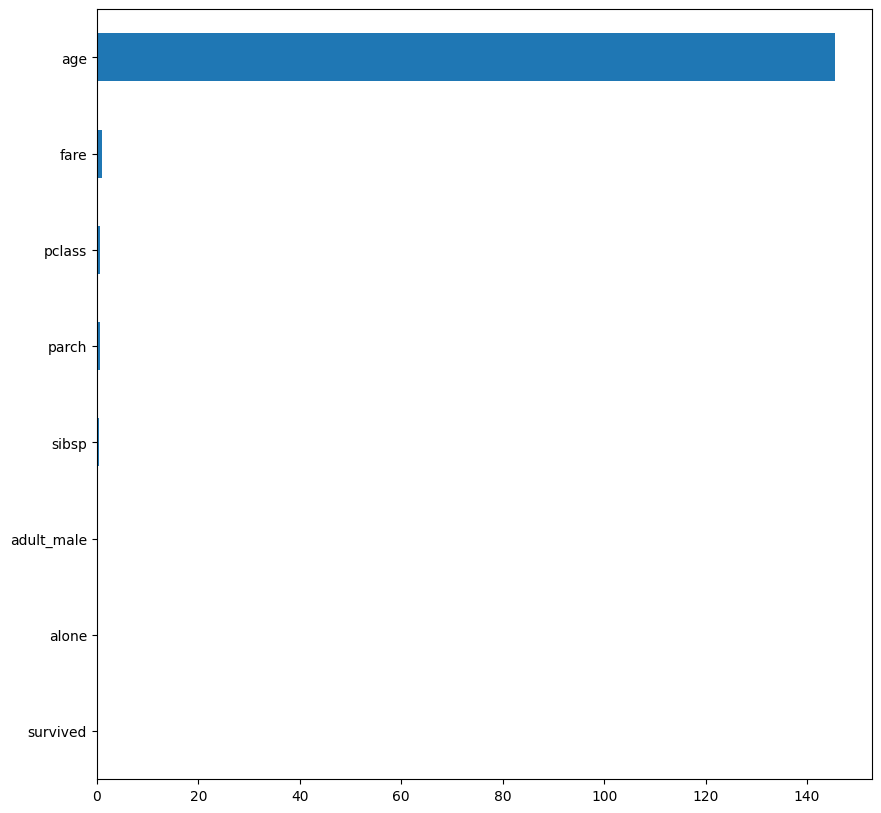

In [148]:
plt.figure(figsize=(10, 10))
df.var().sort_values(ascending=True).plot.barh();

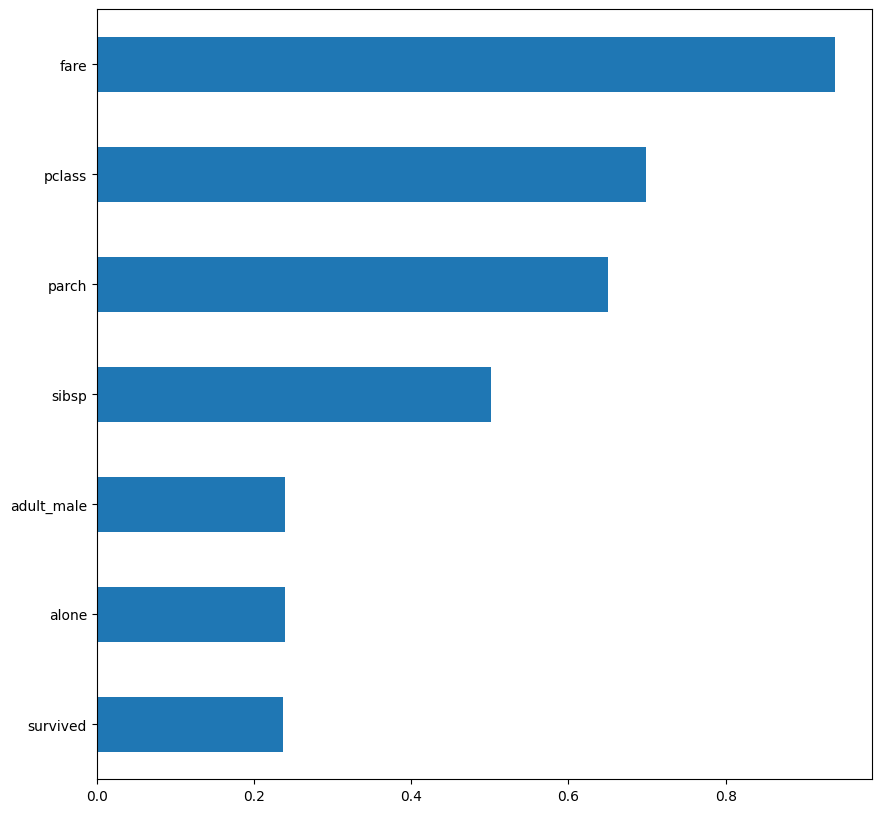

In [149]:
plt.figure(figsize=(10, 10))
df.loc[:, df.columns != "age"].var().sort_values(ascending=True).plot.barh();

In [150]:
encoded_df.var().sort_values(ascending=False)

age            145.492694
fare             0.939055
pclass           0.699015
class            0.699015
parch            0.649728
embarked         0.626477
embark_town      0.626477
sibsp            0.501612
who              0.353182
adult_male       0.239723
alone            0.239723
survived         0.236772
alive            0.236772
sex              0.228475
dtype: float64

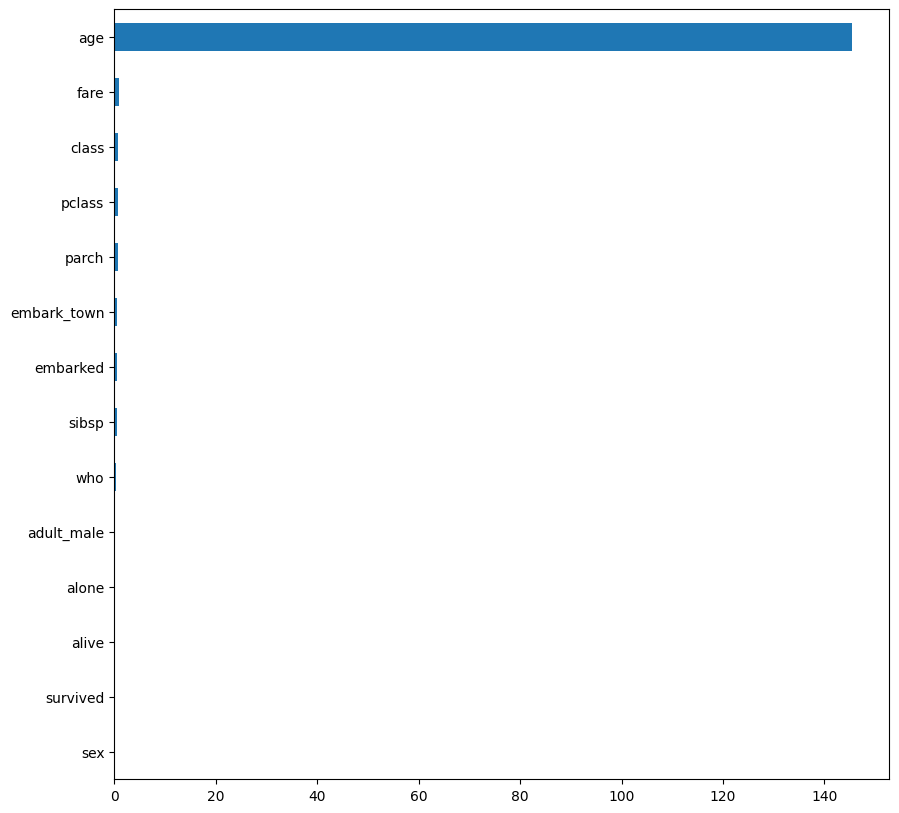

In [151]:
plt.figure(figsize=(10, 10))
encoded_df.var().sort_values(ascending=True).plot.barh();

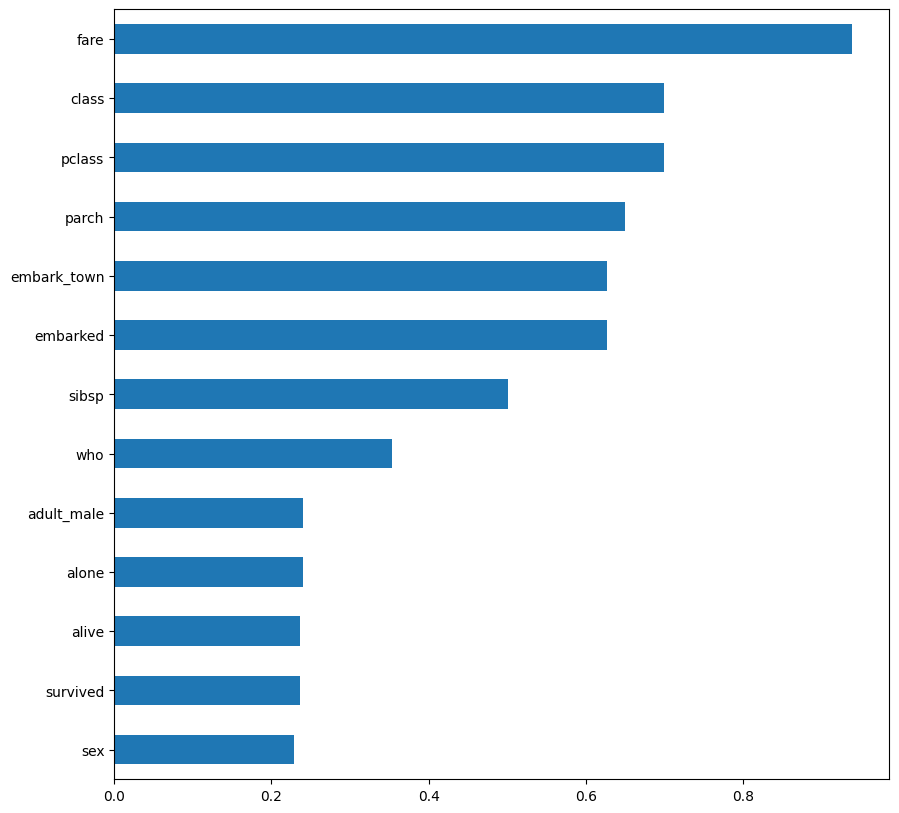

In [152]:
plt.figure(figsize=(10, 10))
encoded_df.loc[:, df.columns != "age"].var().sort_values(ascending=True).plot.barh();

### Covariance between target var

#### Way-1

In [153]:
def numerical_covariance(df, target_var):
    # Separate out numerical columns
    numerical_cols = df.select_dtypes(include=[int, float, "int8", bool]).columns

    # Create a copy of the DataFrame with only the numerical columns
    numerical_df = df[numerical_cols].copy()

    # If the target variable is categorical, encode it temporarily
    if df[target_var].dtype == 'object' or df[target_var].dtype == 'category':
        temp_encode = pd.get_dummies(df[target_var], prefix=target_var)
        numerical_df = pd.concat([numerical_df, temp_encode], axis=1)
        target_var = temp_encode.columns[0]

    # Calculate the covariance between each numerical column and the target variable
    covariances = numerical_df.cov()[target_var]

    # Return the result as a pandas Series
    return covariances

In [154]:
covariances = numerical_covariance(df, target_var)
covariances

survived      0.236772
pclass       -0.137703
age          -0.386536
sibsp         0.010833
parch         0.032017
fare          0.155540
adult_male   -0.132720
alone        -0.048451
Name: survived, dtype: float64

<Axes: >

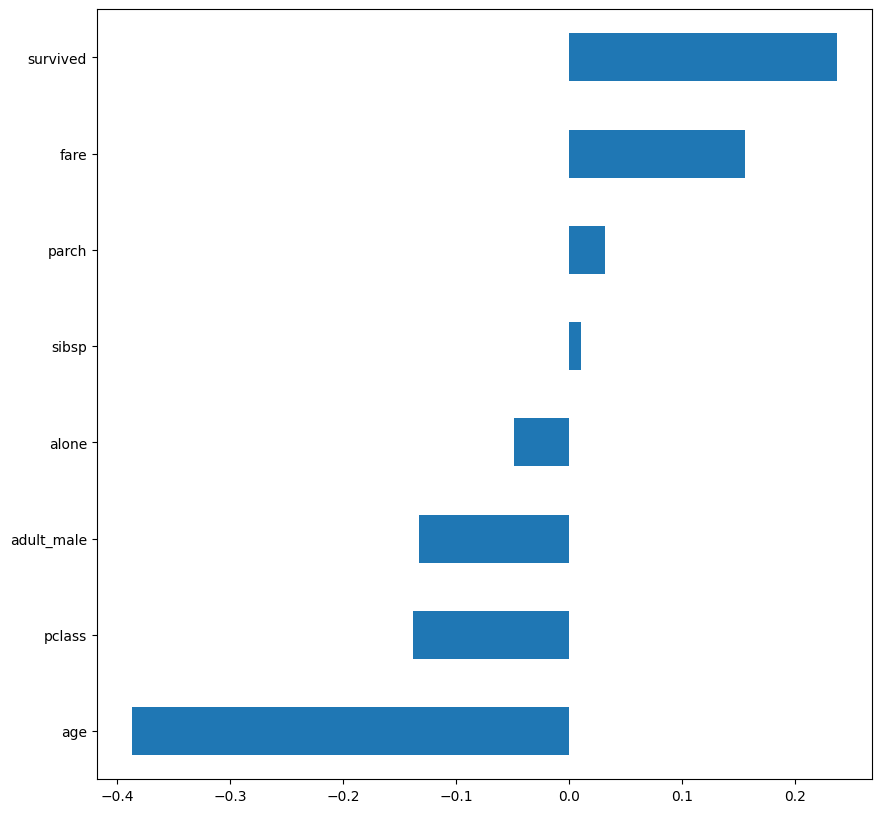

In [155]:
plt.figure(figsize=(10, 10))
covariances.sort_values(ascending=True).plot.barh()

<Axes: >

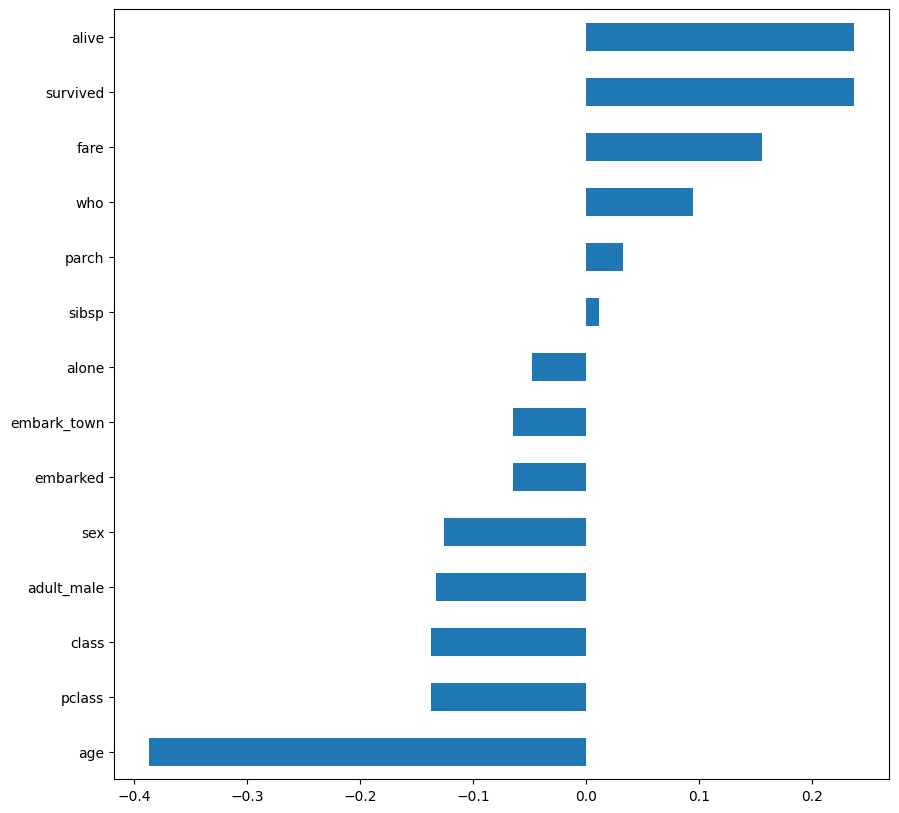

In [156]:
plt.figure(figsize=(10, 10))
numerical_covariance(encoded_df, target_var).sort_values(ascending=True).plot.barh()

#### Way-2
```python
# Calculate the covariance between the target and the feature
cov = {  col: [ np.cov(df[target_var].cat.codes, df[col])[0,1] ] for col in num_cols }
cov_s = pd.Series(np.squeeze(list(cov.values())), index=cov.keys())
cov_s
```

## Final Feature Selection

In [157]:
remove_cols =  [col for col, _ in high_corr_vars]
remove_cols

['alive', 'pclass', 'embark_town', 'adult_male']

In [158]:
df = df.drop(columns=remove_cols, axis=1)

In [159]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   survived  891 non-null    int64   
 1   sex       891 non-null    category
 2   age       891 non-null    float64 
 3   sibsp     891 non-null    float64 
 4   parch     891 non-null    int64   
 5   fare      891 non-null    float64 
 6   embarked  891 non-null    category
 7   class     891 non-null    category
 8   who       891 non-null    category
 9   alone     891 non-null    bool    
dtypes: bool(1), category(4), float64(3), int64(2)
memory usage: 39.8 KB


In [160]:
spare_df = df.copy()

In [161]:
num_cols = df.select_dtypes(exclude=("category")).columns
cat_cols = df.select_dtypes(include=("category")).columns

In [162]:
num_cols

Index(['survived', 'age', 'sibsp', 'parch', 'fare', 'alone'], dtype='object')

In [163]:
cat_cols

Index(['sex', 'embarked', 'class', 'who'], dtype='object')

# (E) Model Selection (Classic ML models)

## Prepare The Data To Training

### Encoding the categorical variables

In [164]:
cat_cols

Index(['sex', 'embarked', 'class', 'who'], dtype='object')

#### Target variable

In [165]:
from sklearn.preprocessing import LabelEncoder
le_target_var = LabelEncoder()

In [166]:
df[target_var].dtype

dtype('int64')

In [167]:
if df[target_var].dtype == "category":
  df[target_var] = le_target_var.fit_transform(df[target_var])
  print(le_target_var.classes_)

In [168]:
df.head()

,survived,sex,age,sibsp,parch,fare,embarked,class,who,alone
0,0,male,22.0,1.0,0,2.110213,S,Third,man,False
1,1,female,38.0,1.0,0,4.280593,C,First,woman,False
2,1,female,26.0,0.0,0,2.188856,S,Third,woman,True
3,1,female,35.0,1.0,0,3.990834,S,First,woman,False
4,0,male,35.0,0.0,0,2.202765,S,Third,man,True


#### Features

In [169]:
df[cat_cols].head(2)

,sex,embarked,class,who
0,male,S,Third,man
1,female,C,First,woman


In [170]:
df.select_dtypes(include=[bool]).head(2)

,alone
0,False
1,False


In [171]:
from sklearn.preprocessing import LabelEncoder

encoders = {}
for col in cat_cols:
  encoders[col] = LabelEncoder()
  df[col] = encoders[col].fit_transform(df[col])

In [172]:
for col in df.select_dtypes(include=[bool]):
  df[col] = df[col].astype(int)

In [173]:
df[cat_cols].head(2)

,sex,embarked,class,who
0,1,2,2,1
1,0,0,0,2


In [174]:
df["alone"].head()

0    0
1    0
2    1
3    0
4    1
Name: alone, dtype: int64

In [175]:
for col, encoder in encoders.items():
  print( f" {col:<15}   class: {encoder.classes_}")

 sex               class: ['female' 'male']
 embarked          class: ['C' 'Q' 'S']
 class             class: ['First' 'Second' 'Third']
 who               class: ['child' 'man' 'woman']


In [176]:
# Appending the target encoder object for further usage
#encoders["Loan_Status"] = le_Loan_Status

In [177]:
encoders["sex"].transform([["female"], ["male"]])

array([0, 1])

In [178]:
encoders["sex"].inverse_transform([[0],[1]])

array(['female', 'male'], dtype=object)

In [179]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   survived  891 non-null    int64  
 1   sex       891 non-null    int64  
 2   age       891 non-null    float64
 3   sibsp     891 non-null    float64
 4   parch     891 non-null    int64  
 5   fare      891 non-null    float64
 6   embarked  891 non-null    int64  
 7   class     891 non-null    int64  
 8   who       891 non-null    int64  
 9   alone     891 non-null    int64  
dtypes: float64(3), int64(7)
memory usage: 69.7 KB


### Splitting the dataset
```python
# train, test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

# train, validation split
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.20)
```

#### Denoting the Features and target variable

In [507]:
X = df.drop(columns=target_var)
y = df[target_var]

#### Train-Test Split

In [508]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

## Util Functions
- Utils functions for model tuning

### Greedy Step tune

In [422]:
from sklearn.model_selection import GridSearchCV
from pprint import pprint

def greedy_search(model, params:dict, X_train, y_train, cv=10, n_jobs=-1, verbose=2, is_print=False):
  """It tunes params individually step by step . select best value on current step.
  It assumes the params sorted by importance on the model as descending. 
  The important param, second important param, etc.... 
  """
  
  best_params = {}
  for name, values in params.items():
    # Initial params
    best_params[name] = values

    if is_print: print("before:");pprint(best_params);
    
    # create GridSearch&Train 
    cv_model = GridSearchCV(model, best_params, cv=cv, n_jobs=n_jobs, verbose=verbose)
    cv_model.fit(X_train, y_train)

    # Update the param
    best_params[name] = [cv_model.best_params_[name]]
    
    if is_print: print("after:");pprint(best_params);print("-"*25, end="\n\n");

  return cv_model, cv_model.best_estimator_, best_params

### Model Tuner

In [423]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report


def gen_clf_metrics(y_test, y_pred, is_round, return_y_data=False):
  """
  Calculate and return a dictionary of common classification metrics.
  """

  if is_round: y_pred = np.round(y_pred).astype(np.int64)

  clf_metrics = {
            "accuracy":accuracy_score(y_test, y_pred),
            "precision" : precision_score(y_test, y_pred, average="micro"),
            "recall": recall_score(y_test, y_pred, average="micro"),
            "f1_score": f1_score(y_test, y_pred, average="micro"),
            "clf_report":classification_report(y_test, y_pred, output_dict=True)
  }

  if return_y_data:
    clf_metrics["y_pred"] = y_pred
    clf_metrics["y_test"] = y_test
            
  
  return clf_metrics

In [424]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score, mean_absolute_error, median_absolute_error

def gen_reg_metrics(y_test, y_pred, is_round, return_y_data=False):
  """
  Calculate and return a dictionary of common regression metrics.
  """

  if is_round: y_pred = np.round(y_pred).astype(np.int64)


  reg_metrics = {
      "MaxError": np.max(y_test - y_pred),
      "MeanAbsoluteError": median_absolute_error(y_test, y_pred),
      "MeanAbsolutePercentageError": np.mean(np.abs((y_test - y_pred) / y_test)) * 100,
      "MSE": mean_squared_error(y_test, y_pred),
      "RMSE": mean_squared_error(y_test, y_pred, squared=False),
      "MAE": mean_absolute_error(y_test, y_pred),
      "R2":r2_score(y_test, y_pred),
      "ExplainedVariance":explained_variance_score(y_test, y_pred)
  }

  if return_y_data:
    reg_metrics["y_pred"] = y_pred
    reg_metrics["y_test"] = y_test


  return reg_metrics

In [425]:
import pandas as pd
def tune_models(tuners, X_train, y_train, X_test, y_test, is_clf, cv=10, is_round=False, return_y_data=False):
  
  results, metric_summary = dict(), dict()
  for name, [model, params] in tuners.items():
    # Tuning
    cv_model, tuned_model, best_params = greedy_search(model, params, X_train, y_train, cv=cv)
    
    # predicting
    y_pred = tuned_model.predict(X_test)
    metric_kwargs = {"y_test":y_test, "y_pred":y_pred, "is_round":is_round, "return_y_data":return_y_data} 
    metric_results = gen_clf_metrics(**metric_kwargs) if is_clf else gen_reg_metrics(**metric_kwargs)

    # Generating results
    cur_results = {
        "tune_results": {
            "cv_model":cv_model,
            "tuned_model":tuned_model,
            "best_params":best_params,
        },
        "metric_results": metric_results
    }
    
    results[name] = cur_results
    metric_summary[name] = metric_results

  return results, pd.DataFrame(metric_summary).T


In [426]:
import pandas as pd
def tune_linear_cv_models(tuners, X_train, y_train, X_test, y_test, is_clf, is_round=False, return_y_data=False):
  
  results, metric_summary = dict(), dict()
  for name, [model, params] in tuners.items():
      # Tuning
      tuned_model = model(**params)
      tuned_model.fit(X_train, y_train)
      
      # predicting
      y_pred = tuned_model.predict(X_test)
      metric_kwargs = {"y_test":y_test, "y_pred":y_pred, "is_round":is_round, "return_y_data":return_y_data} 
      metric_results = gen_clf_metrics(**metric_kwargs) if is_clf else gen_reg_metrics(**metric_kwargs)

      # Generating results
      cur_results = {
          "tune_results": {
              "tuned_model":tuned_model,
              "best_params":tuned_model.get_params(True) ,#best_params_,
          },
          "metric_results": metric_results
      }
      
      results[name] = cur_results
      metric_summary[name] = metric_results

  return results, pd.DataFrame(metric_summary).T

### Learning Curve Plotter

In [427]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import learning_curve

def plot_learning_curve(model, name, X, y, ylim=None, cv=None, n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5), figsize=(20,20)):

    # checking the params
    if ylim is not None: plt.ylim(*ylim)
    
    # pre-declerations
    orange, blue = "#ff9124", "#2492ff"

    # Extracting the learning curve
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    
    # Extracting the scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # calculating params    
    tra_left_edge = train_scores_mean - train_scores_std
    tra_right_edge = train_scores_mean + train_scores_std

    test_left_edge = test_scores_mean - test_scores_std
    test_right_edge = test_scores_mean + test_scores_std

    # transparent plot for confidence value range
    plt.fill_between(train_sizes, tra_left_edge, tra_right_edge, alpha=0.1, color=orange)
    plt.fill_between(train_sizes, test_left_edge, test_right_edge, alpha=0.1, color=blue)
    
    # Plotting as point
    plt.plot(train_sizes, train_scores_mean, 'o-', color=orange, label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color=blue, label="Cross-validation score")
    
    # Configurating the plottings
    plt.title(f"{name} Learning Curve", fontsize=14)
    plt.xlabel('Training size (m)')
    plt.ylabel('Score')
    plt.grid(True)
    plt.legend(loc="best")

In [428]:
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier

def get_learning_curve_stats(clfs, X_train, y_train, cv, model_size, rs, cs, figsize, ylim):

  plt.figure(figsize=figsize)
  # EXtracting the learning curve and validation metrics
  best_models_cross_val_preds, roc_auc_scores = {}, {}
  for i, (name, model) in enumerate(clfs.items()):

    # Training with best models again (the best params already saved inside) for visualizate the duration.
    plt.subplot(rs, cs, i+1)
    print(f"{i}.turn [{name}], plotting learning curve")
    plot_learning_curve(model, name, X_train, y_train, ylim, cv=cv, n_jobs=-1, figsize=figsize) 

    # validating the trained models
    #print(f"{i}.turn, cross_validation")
    #method = "decision_function" if name in ["loj_reg", "svc"] else "predict"
    #best_models_cross_val_preds[name]  = cross_val_predict(model, X_train, y_train, cv=5, method=method)

    # Displating the roc scores
    #print(f"{i}.turn, roc_auc_scores")
    #roc_auc_scores[name] = roc_auc_score(y_train, best_models_cross_val_preds[name])
    #print(f'{name:<20}: ',roc_auc_scores[name])

  return plt.gcf()#, best_models_cross_val_preds#, roc_auc_scores

## (1) Linear Models

#### Hyperparams

In [535]:
lin_params = {
    'fit_intercept': [True, False],
    #'normalize': [True, False],
    'copy_X': [True, False],
}
from sklearn.linear_model import LinearRegression
linear_reg = [LinearRegression(), lin_params]

In [536]:
lasso_params = {
    "alphas": np.logspace(-4, 0, 100),
    #"cv": [3, 5, 10],
    #"normalize": True,
    #"tol": [1e-4, 1e-3, 1e-2]
}
from sklearn.linear_model import LassoCV
l1_reg = [LassoCV, lasso_params] 

In [537]:
ridge_params = {
    "alphas": (10**np.linspace(10,-2,100))*0.5,
    "scoring":"neg_mean_squared_error",
    #"normalize": True
}

from sklearn.linear_model import RidgeClassifierCV 
l2_reg = [RidgeClassifierCV, ridge_params]

In [538]:
ElasticNet_params = {
    "alphas": np.logspace(-4, 0, 100),
    #"cv": 10, #[3, 5, 10],
    #"normalize": True#[True, False],
    #"tol": [1e-4, 1e-3, 1e-2]
}

from sklearn.linear_model import ElasticNetCV 
enet_reg = [ElasticNetCV, ElasticNet_params]

In [539]:
linear_cv_tuners = {
    "l1_reg":l1_reg,
    "l2_reg":l2_reg,
    "enet_reg":enet_reg
}
linear_tuners = {
    "lin_reg":linear_reg,
    #**linear_cv_tuners
}

#### Tuning Demostration

In [540]:
lin_results, lin_metric_summary = tune_linear_cv_models(linear_cv_tuners, X_train, y_train, X_test , y_test, is_clf=False, is_round=True) # X_train_us, y_train_us, X_test_us, y_test_us,

In [541]:
list(lin_results.keys())

['l1_reg', 'l2_reg', 'enet_reg']

In [542]:
lin_metric_summary

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
l1_reg,1.0,0.0,inf,0.173184,0.416154,0.173184,0.285843,0.296268
l2_reg,1.0,0.0,100.0,0.413408,0.642968,0.413408,-0.704762,0.000000
enet_reg,1.0,0.0,inf,0.173184,0.416154,0.173184,0.285843,0.296268


In [543]:
from pprint import pprint
pprint(lin_results)

{'enet_reg': {'metric_results': {'ExplainedVariance': 0.29626769626769633,
                                 'MAE': 0.17318435754189945,
                                 'MSE': 0.17318435754189945,
                                 'MaxError': 1,
                                 'MeanAbsoluteError': 0.0,
                                 'MeanAbsolutePercentageError': inf,
                                 'R2': 0.28584298584298595,
                                 'RMSE': 0.41615424729527806},
              'tune_results': {'best_params': {'alphas': array([1.00000000e-04, 1.09749877e-04, 1.20450354e-04, 1.32194115e-04,
       1.45082878e-04, 1.59228279e-04, 1.74752840e-04, 1.91791026e-04,
       2.10490414e-04, 2.31012970e-04, 2.53536449e-04, 2.78255940e-04,
       3.05385551e-04, 3.35160265e-04, 3.67837977e-04, 4.03701726e-04,
       4.43062146e-04, 4.86260158e-04, 5.33669923e-04, 5.85702082e-04,
       6.42807312e-04, 7.05480231e-04, 7.74263683e-04, 8.49753436e-04,
       9.32603347e-04

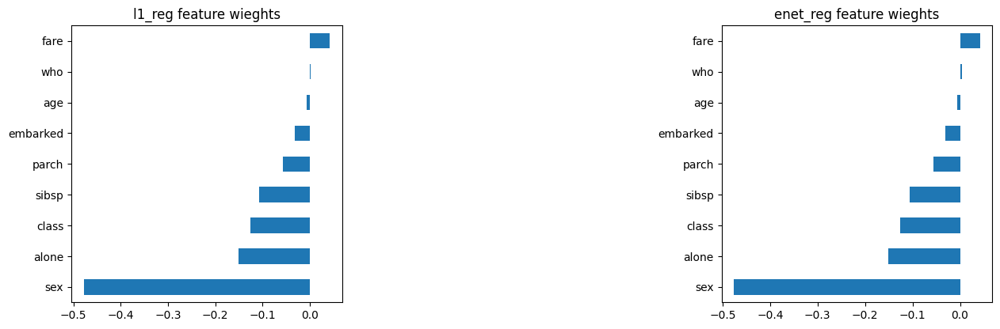

In [544]:
size = len(lin_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*5, rs*5))
lin_models = {}
for i, model_name in enumerate(lin_results.keys()):

  cur_model = lin_results[model_name]["tune_results"]["tuned_model"]
  lin_models[model_name] = cur_model
  
  if model_name not in ["l2_reg"]:
    plt.subplot(rs,cs,i+1)
    pd.Series(cur_model.coef_, X_train.columns).sort_values().plot(kind="barh")
    plt.title(f"{model_name} feature wieghts")

0.turn [l1_reg], plotting learning curve
1.turn [l2_reg], plotting learning curve
2.turn [enet_reg], plotting learning curve


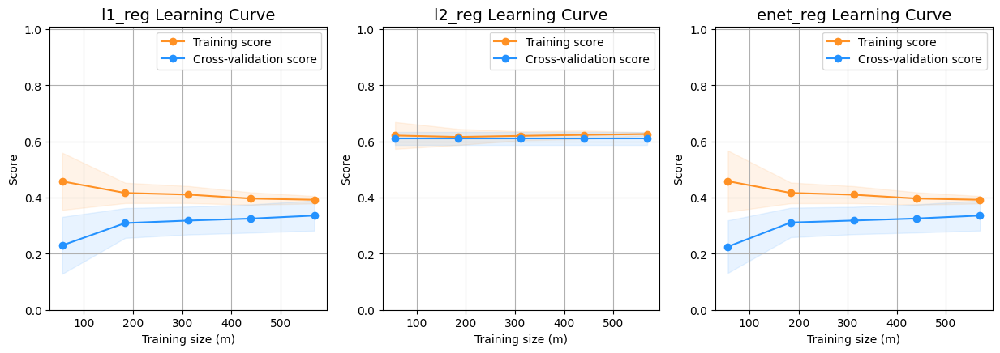

In [545]:
# Example Usage
model_size = len(lin_models)
rs, cs = (model_size//3+1, 3 ) if model_size >= 3 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*5,rs*5),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(lin_models, X_train, y_train,  **lcs_params)

In [546]:
lin_reg_results, lin_reg_metric_summary = tune_models(linear_tuners, X_train, y_train, X_test , y_test, is_clf=False, is_round=True)

Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits


In [547]:
list(lin_reg_results.keys())

['lin_reg']

In [548]:
lin_reg_metric_summary

,ExplainedVariance,MAE,MSE,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,R2,RMSE
lin_reg,0.271042,0.178771,0.178771,1.0,0.0,inf,0.262806,0.422813


In [549]:
from pprint import pprint
pprint(lin_reg_results)

{'lin_reg': {'metric_results': {'ExplainedVariance': 0.27104247104247103,
                                'MAE': 0.1787709497206704,
                                'MSE': 0.1787709497206704,
                                'MaxError': 1,
                                'MeanAbsoluteError': 0.0,
                                'MeanAbsolutePercentageError': inf,
                                'R2': 0.26280566280566287,
                                'RMSE': 0.422813138065352},
             'tune_results': {'best_params': {'copy_X': [True],
                                              'fit_intercept': [True]},
                              'cv_model': GridSearchCV(cv=10, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'copy_X': [True], 'fit_intercept': [True]}, verbose=2),
                              'tuned_model': LinearRegression()}}}


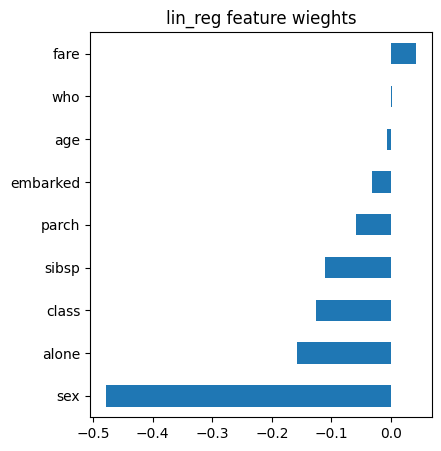

In [550]:
size = len(lin_reg_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*5, rs*5))
lin_reg_models = dict()
for i, model_name in enumerate(lin_reg_results.keys()):

  cur_model = lin_reg_results[model_name]["tune_results"]["tuned_model"]
  lin_reg_models[model_name] = cur_model

  plt.subplot(rs,cs,i+1)
  pd.Series(cur_model.coef_, X_train.columns).sort_values().plot(kind="barh")
  plt.title(f"{model_name} feature wieghts")

0.turn [lin_reg], plotting learning curve


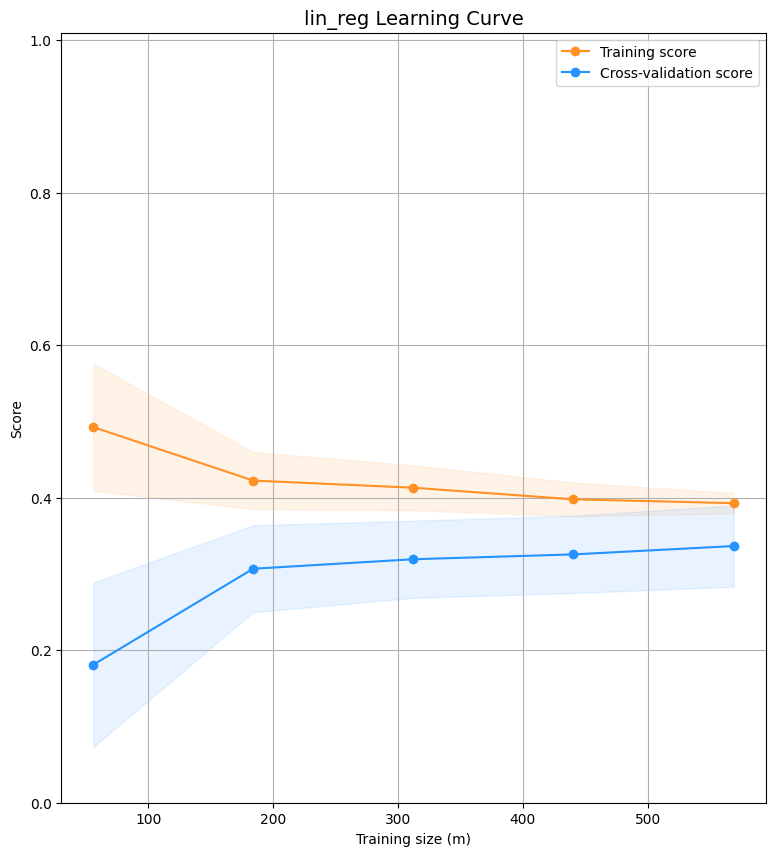

In [551]:
# Example Usage
model_size = len(lin_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*10,rs*10),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(lin_reg_models, X_train, y_train,**lcs_params)

## (2) Non-Linear Models 

#### Hyperparams

In [518]:
loj_params = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': np.logspace(-3, 3, 7),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 200, 300, 400, 500],
    'fit_intercept': [True, False],
    'intercept_scaling': [0.5, 1, 2]
}
from sklearn.linear_model import LogisticRegression
loj_reg = [LogisticRegression(), loj_params]

In [519]:
nb_params = {
    "priors": [None, [0.1, 0.9], [0.2, 0.8], [0.3, 0.7], [0.4, 0.6], [0.5, 0.5]],
    "var_smoothing":  np.linspace(1e-6, 1e-12, 10)
}
from sklearn.naive_bayes import GaussianNB
nb = [GaussianNB(), nb_params]

In [520]:
knn_params = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [10, 20, 30, 40, 50],
    'p': [1, 2, 3, 4, 5],
}
from sklearn.neighbors import KNeighborsClassifier
knn = [KNeighborsClassifier() , knn_params]

In [521]:
svc_params = {
    'C': np.logspace(-3, 3, 7),
    #'kernel': ["linear", "rbf"], # ['linear', 'poly', 'rbf', 'sigmoid'],
    #'degree': [2, 3, 4, 5],
    #'gamma': ['scale', 'auto'] + list(np.logspace(-3, 3, 7)),
    #'coef0': [-1, 0, 1],
    #'shrinking': [True, False],
    #'probability': [True, False],
    #'tol': [1e-3, 1e-4, 1e-5],
    #'max_iter': [-1, 1000, 10000, 100000],
    #"class_weight": [None, "balanced"]
}
from sklearn.svm import SVC
svc = [SVC() , svc_params]

In [522]:
dt_params = {
    "max_depth": [3, 5, 7, None],
    "min_samples_split": [2, 3, 4, 5],
    "min_samples_leaf": [1, 2, 3, 4],
    "criterion": ["gini", "entropy"],
    "splitter": ["best", "random"],
    "max_features": [None, "auto", "log2"],
    "class_weight": [None, "balanced"]
}
from sklearn.tree import DecisionTreeClassifier
dt = [DecisionTreeClassifier() , dt_params]

In [523]:
non_linear_tuners = {
    "loj_reg":loj_reg,
    "nb_params":nb,
    "knn":knn,
    "svc":svc,
    "dt":dt
}

#### Tuning Demostration



In [524]:
non_lin_results, non_lin_metric_summary = tune_models(non_linear_tuners, X_train, y_train, X_test , y_test, is_clf=True)

Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 7 candidates, totalling 70 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 6 candidates, totalling 60 fits
Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 9 candidates, totalling 90 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 5 candidates, totalling 50 fits
Fitting 10 folds for each of 7 candidates, totalling 70 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for e

In [525]:
list(non_lin_results.keys())

['loj_reg', 'nb_params', 'knn', 'svc', 'dt']

In [526]:
non_lin_metric_summary

,accuracy,precision,recall,f1_score,clf_report
loj_reg,0.826816,0.826816,0.826816,0.826816,"{'0': {'precision': 0.8245614035087719, 'recal..."
nb_params,0.787709,0.787709,0.787709,0.787709,"{'0': {'precision': 0.8252427184466019, 'recal..."
knn,0.804469,0.804469,0.804469,0.804469,"{'0': {'precision': 0.7916666666666666, 'recal..."
svc,0.832402,0.832402,0.832402,0.832402,"{'0': {'precision': 0.8378378378378378, 'recal..."
dt,0.782123,0.782123,0.782123,0.782123,"{'0': {'precision': 0.7357142857142858, 'recal..."


In [527]:
from pprint import pprint
pprint(non_lin_results)

{'dt': {'metric_results': {'accuracy': 0.7821229050279329,
                           'clf_report': {'0': {'f1-score': 0.8408163265306122,
                                                'precision': 0.7357142857142858,
                                                'recall': 0.9809523809523809,
                                                'support': 105},
                                          '1': {'f1-score': 0.6548672566371682,
                                                'precision': 0.9487179487179487,
                                                'recall': 0.5,
                                                'support': 74},
                                          'accuracy': 0.7821229050279329,
                                          'macro avg': {'f1-score': 0.7478417915838902,
                                                        'precision': 0.8422161172161172,
                                                        'recall': 0.7404761904761905,
            

In [528]:
non_lin_reg_models = dict()
for i, model_name in enumerate(non_lin_results.keys()):

  cur_model = non_lin_results[model_name]["tune_results"]["tuned_model"]
  non_lin_reg_models[model_name] = cur_model

In [529]:
non_lin_reg_models

{'loj_reg': LogisticRegression(C=10.0, intercept_scaling=0.5),
 'nb_params': GaussianNB(var_smoothing=1e-06),
 'knn': KNeighborsClassifier(leaf_size=20),
 'svc': SVC(C=1000.0),
 'dt': DecisionTreeClassifier(max_depth=3, min_samples_leaf=3, splitter='random')}

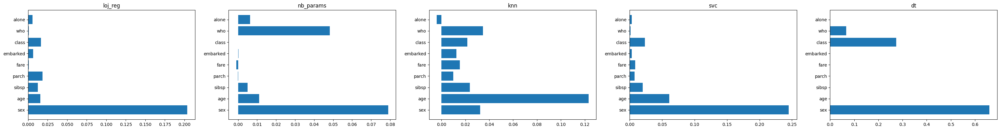

In [530]:
from sklearn.inspection import permutation_importance

size = len(non_lin_results.keys())
rs, cs = (size//5+1, 5) if size>=5 else (size//4+1, 4)

plt.figure(figsize=(cs*8, rs*5))
# plot feature importance for each model
for i, (name, model) in enumerate(non_lin_reg_models.items()):
    
    # Extracting the importance
    if hasattr(model, 'feature_importances_'):
        # for tree-based models
        importances = model.feature_importances_
    else:
        # for non-tree-based models
        result = permutation_importance(model, X_train, y_train, n_repeats=10, random_state=0)
        importances = result.importances_mean
    
    plt.subplot(rs,cs,i+1)
    plt.barh( X_train.columns, importances)
    plt.title(name)
    #plt.yticks(range(len(indices)), [f'feature {i+1}' for i in indices])
    #plt.xlabel('Relative Importance')


0.turn [loj_reg], plotting learning curve
1.turn [nb_params], plotting learning curve
2.turn [knn], plotting learning curve
3.turn [svc], plotting learning curve
4.turn [dt], plotting learning curve


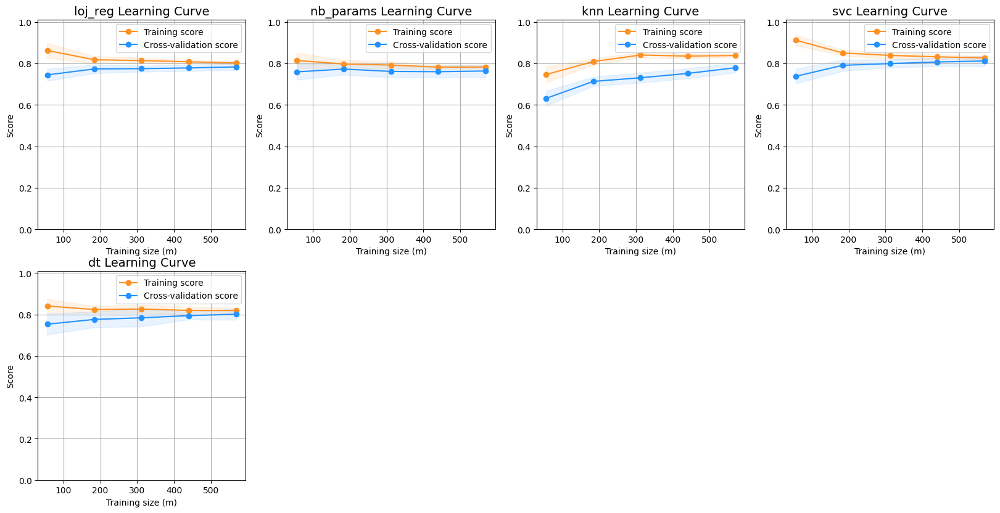

In [531]:
# Example Usage
model_size = len(non_lin_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv" : ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*5,rs*5),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(non_lin_reg_models, X_train, y_train,  **lcs_params)

## (3) Ensemble Models

#### Hyperparams

In [482]:
# Defining parameters
rf_params = {
    "n_estimators": [10, 50, 100, 200],
    "criterion": ["gini", "entropy"],
    #"max_depth": [3, 5, 7, None],
    "min_samples_split": [2, 3, 4, 5],
    "min_samples_leaf": [1, 2, 3, 4],
    #"max_features": [None, "auto", "log2"],
    #"class_weight": [None, "balanced"],
    #"bootstrap": [True, False],
    #"oob_score": [True, False],
    #"n_jobs": [None, -1, 1]
}
from sklearn.ensemble import RandomForestClassifier
rf = [RandomForestClassifier(), rf_params] 

In [483]:
# Defining parameters
gbc_params = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [100, 200, 300],
    #'max_depth': [3, 5, 7],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [1, 2, 4],
    #'max_features': ['auto', 'sqrt', 'log2'],
    #'subsample': [0.7, 0.8, 0.9]
}
from sklearn.ensemble import GradientBoostingClassifier
gbc = [GradientBoostingClassifier(), gbc_params] 

In [484]:
# Defining parameters
xgbc_params = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [100, 200, 300],
    #'max_depth': [3, 5, 7],
    'min_child_weight': [1, 2, 4],
    #'gamma': [0, 0.1, 0.2],
    #'subsample': [0.7, 0.8, 0.9],
    #'colsample_bytree': [0.7, 0.8, 0.9],
    #'reg_alpha': [0, 1e-1, 1],
    #'reg_lambda': [0, 1e-1, 1]
}
from xgboost import XGBClassifier
xgbc = [XGBClassifier(), xgbc_params] 

In [485]:
# Defining parameters
lgbm_params = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [100, 200, 300],
    #'num_leaves': [31, 63, 127],
    #'max_depth': [3, 5, 7],
    'min_child_samples': [10, 20, 30],
    #'min_child_weight': [1e-3, 1e-2, 1e-1],
    #'subsample': [0.7, 0.8, 0.9],
    #'colsample_bytree': [0.7, 0.8, 0.9],
    #'reg_alpha': [0, 1e-1, 1],
    #'reg_lambda': [0, 1e-1, 1]
}
from lightgbm import LGBMClassifier
lgbm = [LGBMClassifier(), lgbm_params] 

In [486]:
!pip install catboost
import os
if os.system("pip freeze | grep catboost==") != 0: os.system("pip install catboost")

cb_params = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [100, 200, 300],
    #'depth': [3, 5, 7],
    #'l2_leaf_reg': [1, 2, 4],
    #'boosting_type': ['Ordered', 'Plain', 'Pointwise'],
    #'colsample_bylevel': [0.7, 0.8, 0.9],
    #'reg_lambda': [0, 1e-1, 1] # or # 'l2_leaf_reg': [1, 2, 4]
}
from catboost import CatBoostClassifier
cb = [CatBoostClassifier(), cb_params] 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [509]:
ensemble_tuners = {
    "rf":rf,
    "gbc":gbc,
    "xgbc":xgbc,
    "lgbm":lgbm,
    "cb":cb
}

#### Tuning Demostration

In [706]:
ensemble_results, ensemble_metric_summary = tune_models(ensemble_tuners,  X_train, y_train, X_test , y_test, is_clf=True)

Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 2 candidates, totalling 20 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
Fitting 10 folds for each of 3 candidates, totalling 30 fits
0:	learn: 0.6873973	total: 1.35ms	remaining: 1.34s
1:	learn: 0.6810721	total: 2.72ms	

In [707]:
list(ensemble_results)

['rf', 'gbc', 'xgbc', 'lgbm', 'cb']

In [709]:
ensemble_metric_summary

,accuracy,precision,recall,f1_score,clf_report
rf,0.882682,0.882682,0.882682,0.882682,"{'0': {'precision': 0.8442622950819673, 'recal..."
gbc,0.837989,0.837989,0.837989,0.837989,"{'0': {'precision': 0.796875, 'recall': 0.9714..."
xgbc,0.854749,0.854749,0.854749,0.854749,"{'0': {'precision': 0.8264462809917356, 'recal..."
lgbm,0.871508,0.871508,0.871508,0.871508,"{'0': {'precision': 0.847457627118644, 'recall..."
cb,0.843575,0.843575,0.843575,0.843575,"{'0': {'precision': 0.8235294117647058, 'recal..."


In [710]:
from pprint import pprint
pprint(ensemble_results)

{'cb': {'metric_results': {'accuracy': 0.8435754189944135,
                           'clf_report': {'0': {'f1-score': 0.8749999999999999,
                                                'precision': 0.8235294117647058,
                                                'recall': 0.9333333333333333,
                                                'support': 105},
                                          '1': {'f1-score': 0.791044776119403,
                                                'precision': 0.8833333333333333,
                                                'recall': 0.7162162162162162,
                                                'support': 74},
                                          'accuracy': 0.8435754189944135,
                                          'macro avg': {'f1-score': 0.8330223880597014,
                                                        'precision': 0.8534313725490196,
                                                        'recall': 0.8247747747747748

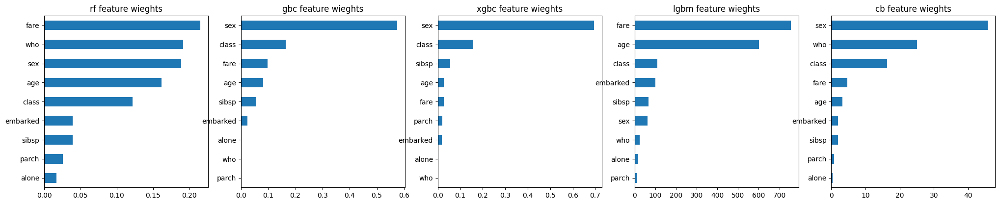

In [711]:
es_model_names = [col for col in ensemble_results.keys() if col not in ["bag_reg"]]
size = len(es_model_names)
rs, cs = (size//5+1, 5) if size>=5 else (size//3+1, 3)

plt.figure(figsize=(cs*5, rs*5))
ensemble_reg_models = dict()
for i, model_name in enumerate(es_model_names):
  if model_name in ["bag_reg"]: continue

  cur_model = ensemble_results[model_name]["tune_results"]["tuned_model"]
  ensemble_reg_models[model_name] = cur_model

  plt.subplot(rs,cs,i+1)
  pd.Series(cur_model.feature_importances_, X_train.columns).sort_values().plot(kind="barh")
  plt.title(f"{model_name} feature wieghts")

0.turn [rf], plotting learning curve
1.turn [gbc], plotting learning curve
2.turn [xgbc], plotting learning curve
3.turn [lgbm], plotting learning curve
4.turn [cb], plotting learning curve


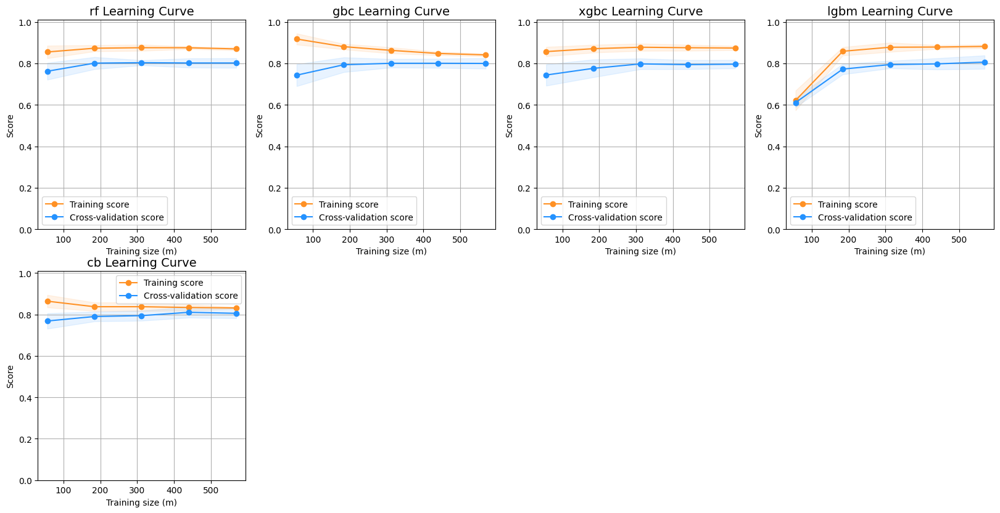

In [712]:
# Example Usage
model_size = len(ensemble_reg_models)
rs, cs = (model_size//2+1, 4 ) if model_size >= 4 else (model_size//2+1, 2)
lcs_params = {
    "cv": ShuffleSplit(n_splits=10, test_size=0.2, random_state=42),
    "model_size": model_size,
    "rs":rs,
    "cs":cs,
    "figsize" : (cs*5,rs*5),
    "ylim" : (0.0, 1.01)
}

lc_plot  = get_learning_curve_stats(ensemble_reg_models, X_train, y_train,  **lcs_params)

## (4) Final Model

### Top models

In [713]:
# lin_results, lin_metric_summary
# lin_reg_results, lin_reg_metric_summary
# non_lin_results, non_lin_metric_summary
# ensemble_results, ensemble_metric_summary

In [714]:
all_results = [lin_results, lin_reg_results, non_lin_results, ensemble_results]

In [715]:
lin_models = pd.concat([lin_metric_summary, lin_reg_metric_summary])
lin_models = lin_models.sort_values(by=['MSE'], ascending=True)
lin_models

,MaxError,MeanAbsoluteError,MeanAbsolutePercentageError,MSE,RMSE,MAE,R2,ExplainedVariance
l1_reg,1.0,0.0,inf,0.173184,0.416154,0.173184,0.285843,0.296268
enet_reg,1.0,0.0,inf,0.173184,0.416154,0.173184,0.285843,0.296268
lin_reg,1.0,0.0,inf,0.178771,0.422813,0.178771,0.262806,0.271042
l2_reg,1.0,0.0,100.0,0.413408,0.642968,0.413408,-0.704762,0.000000


In [716]:
non_linear_model = pd.concat([non_lin_metric_summary, ensemble_metric_summary])
non_linear_model = non_linear_model.sort_values(by=['accuracy','f1_score'],  ascending=False)
non_linear_model

,accuracy,precision,recall,f1_score,clf_report
rf,0.882682,0.882682,0.882682,0.882682,"{'0': {'precision': 0.8442622950819673, 'recal..."
lgbm,0.871508,0.871508,0.871508,0.871508,"{'0': {'precision': 0.847457627118644, 'recall..."
xgbc,0.854749,0.854749,0.854749,0.854749,"{'0': {'precision': 0.8264462809917356, 'recal..."
cb,0.843575,0.843575,0.843575,0.843575,"{'0': {'precision': 0.8235294117647058, 'recal..."
gbc,0.837989,0.837989,0.837989,0.837989,"{'0': {'precision': 0.796875, 'recall': 0.9714..."
svc,0.832402,0.832402,0.832402,0.832402,"{'0': {'precision': 0.8378378378378378, 'recal..."
loj_reg,0.826816,0.826816,0.826816,0.826816,"{'0': {'precision': 0.8245614035087719, 'recal..."
knn,0.804469,0.804469,0.804469,0.804469,"{'0': {'precision': 0.7916666666666666, 'recal..."
nb_params,0.787709,0.787709,0.787709,0.787709,"{'0': {'precision': 0.8252427184466019, 'recal..."
dt,0.782123,0.782123,0.782123,0.782123,"{'0': {'precision': 0.7357142857142858, 'recal..."


In [717]:
non_linear_model.index

Index(['rf', 'lgbm', 'xgbc', 'cb', 'gbc', 'svc', 'loj_reg', 'knn', 'nb_params',
       'dt'],
      dtype='object')

### Final Model

#### Greedy Selection

In [718]:
best_model_name = non_linear_model.iloc[0].name
best_model_name

'rf'

In [719]:
tuned_model, best_params = None, None
for results in all_results:
  if best_model_name in results:
      tuned_model = results[best_model_name]["tune_results"]["tuned_model"]
      best_params = results[best_model_name]["tune_results"]["best_params"]

In [720]:
tuned_model.score(X_test, y_test)

0.88268156424581

In [721]:
tuned_model.score(X_train, y_train)

0.8721910112359551

# (F) Saving & Downloading the model

### Saving the model

In [722]:
import pickle
model_save_path = 'rf_model.sav'
pickle.dump(tuned_model, open(model_save_path, 'wb'))

In [723]:
import json

# Extracting the encodings of categorical variables 
classes = dict()
for col, encoder in encoders.items():
  classes[col] = {i:cls for i, cls in enumerate(encoder.classes_)}

# Saving the cat encodings
endoing_json_path = "cat_encods.json"
with open(endoing_json_path,"w+") as f: json.dump(classes, f)

In [724]:
for col, encoder in encoders.items():
  print(f"{col:<20} {encoder.classes_}")

sex                  ['female' 'male']
embarked             ['C' 'Q' 'S']
class                ['First' 'Second' 'Third']
who                  ['child' 'man' 'woman']


In [725]:
imverse_class = {}
for col, clss in classes.items():
  imverse_class[col]  = {val:key for key, val in clss.items()}

### Loading the model

In [726]:
loaded_model = pickle.load(open(model_save_path, 'rb'))

In [727]:
loaded_model.score(X_test, y_test)

0.88268156424581

In [728]:
import json

# loading the encodings of categorical variables
loaded_cls_enc = json.load(open(endoing_json_path, "r"))
loaded_cls_enc 

{'sex': {'0': 'female', '1': 'male'},
 'embarked': {'0': 'C', '1': 'Q', '2': 'S'},
 'class': {'0': 'First', '1': 'Second', '2': 'Third'},
 'who': {'0': 'child', '1': 'man', '2': 'woman'}}

### Zipping the model
```python
import os 
zip_dst, src = f"{model_save_path}.zip", model_save_path
os.system(f"zip -r {zip_dst} {src}" )
```

### Downloading the model

In [729]:
from google.colab import files
files.download(model_save_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# (G) Deployment as App

## APP (loading from file)

### Declerations & Util Funcs

In [731]:
!pip install gradio
import gradio as gr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 40.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 KB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 KB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 KB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.1/144.1 KB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 54.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.8/57.8 KB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 KB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 KB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 KB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 K

In [733]:
import pickle
import json 
import numpy as np
import pandas as pd

# File Paths
model_path = 'rf_model.sav'
endoing_path = "cat_encods.json"
component_config_path = "component_configs.json"

# predefined

cat_cols = ['sex', 'embarked', 'class', 'who']
num_cols = ['age', 'sibsp', 'parch', 'fare', 'alone']

target = "survived"

feature_order = ['sex', 'age', 'sibsp', 'parch', 'fare', 'embarked', 'class', 'who', 'alone']

# Loading the files
model = pickle.load(open(model_path, 'rb'))

# loading the classes & type casting the encoding indexes
classes = json.load(open(endoing_path, "r"))
classes = {k:{int(num):cat for num,cat in v.items() } for k,v in classes.items()}

inverse_class = {col:{val:key for key, val in clss.items()}  for col, clss in classes.items()}

labels = ["not survived", "survived"]#classes[target].values()

feature_limitations = json.load(open(component_config_path, "r"))

In [ ]:
examples = [
    ['female', 24.0, 2.5, 2.0, 5.5759491, 'S', 'First', 'woman', 0.0],
    ['male', 2.5, 0.0, 2.0, 3.637696679934592, 'C', 'Second', 'child',0.0],
    ['female', 29, 2.5, 2.0, 4.256321678298823, 'S','Third', 'woman', 0.0],
    ['male', 32, 0.0, 0.0, 2.169053700369523, 'Q', 'Third', 'man',1.0]
]

In [734]:
def decode(col, data):
  return classes[col][data]

def encode(col, str_data):
  return inverse_class[col][str_data]

def feature_decode(df):

  # exclude the target var
  cat_cols = list(classes.keys())
  if "survived" in cat_cols:
    cat_cols.remove("survived")

  for col in cat_cols:
     df[col] = decode(col, df[col])

  return df

def feature_encode(df):
  
  # exclude the target var
  cat_cols = list(classes.keys())
  if "survived" in cat_cols:
    cat_cols.remove("survived")
  
  for col in cat_cols:
     df[col] = encode(col, df[col])
  
  return df

In [735]:
def predict(*args):

  # preparing the input into convenient form
  features = pd.Series([*args], index=feature_order)
  features = feature_encode(features)
  features = np.array(features).reshape(-1,len(feature_order))

  # prediction
  probabilities = model.predict_proba(features) #.predict(features)
  probs = probabilities.flatten()

  # output form
  results = {l : np.round(p, 3) for l, p in zip(labels, probs)}

  return results

In [736]:
ex_data = ["male", 21.0, 0.0, 0.0, 2.174751721484161, 'S', 'Third', 'man', 1.0]
predict(*ex_data)

{'not survived': 0.858, 'survived': 0.142}

### Declerating the components

In [737]:
import gradio as gr


inputs = list()
for col in feature_order:
  if col in feature_limitations["cat"].keys():
    
    # extracting the params
    vals = feature_limitations["cat"][col]["values"]
    def_val = feature_limitations["cat"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Dropdown(vals, default=def_val, label=col))
  else:
    
    # extracting the params
    min = feature_limitations["num"][col]["min"]
    max = feature_limitations["num"][col]["max"]
    def_val = feature_limitations["num"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Slider(minimum=min, maximum=max, default=def_val, label=col) )


### Launching the demo app

In [830]:
import gradio as gr
# Creating application
gr.Interface(predict, inputs, "label", examples=examples).launch()

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>

## Manuels (with out file, code form)

### Declerations & Util Funcs

In [ ]:
!pip install gradio
import gradio as gr

In [ ]:
import pickle
import json 
import numpy as np
import pandas as pd

# File Paths
model_path = 'finalized_model.sav'
endoing_path = "cat_encods.json"
component_config_path = "component_configs.json"

# predefined

cat_cols = ['sex', 'embarked', 'class', 'who']
num_cols = ['age', 'sibsp', 'parch', 'fare', 'alone']

target = "survived"

feature_order = ['sex', 'age', 'sibsp', 'parch', 'fare', 'embarked', 'class', 'who', 'alone']

# Loading the files
model = pickle.load(open(model_path, 'rb'))

# loading the classes & type casting the encoding indexes
classes = json.load(open(endoing_path, "r"))
classes = {k:{int(num):cat for num,cat in v.items() } for k,v in classes.items()}

inverse_class = {col:{val:key for key, val in clss.items()}  for col, clss in classes.items()}

labels = ["not survived", "survived"]#classes[target].values()

#feature_limitations = json.load(open(component_config_path, "r"))

In [ ]:
def decode(col, data):
  return classes[col][data]

def encode(col, str_data):
  return inverse_class[col][str_data]

def feature_decode(df):

  # exclude the target var
  cat_cols = list(classes.keys())
  if "survived" in cat_cols:
    cat_cols.remove("survived")

  for col in cat_cols:
     df[col] = decode(col, df[col])

  return df

def feature_encode(df):
  
  # exclude the target var
  cat_cols = list(classes.keys())
  if "survived" in cat_cols:
    cat_cols.remove("survived")
  
  for col in cat_cols:
     df[col] = encode(col, df[col])
  
  return df

In [ ]:
def predict(*args):

  # preparing the input into convenient form
  features = pd.Series([*args], index=feature_order)
  features = feature_encode(features)
  features = np.array(features).reshape(-1,len(feature_order))

  # prediction
  probabilities = model.predict_proba(features) #.predict(features)
  probs = probabilities.flatten()

  # output form
  results = {l : np.round(p, 3) for l, p in zip(labels, probs)}

  return results

### Extracting the input params

In [ ]:
ex_obs_fea, ex_obs_tar = dict(X_test.iloc[0,:]), y_test.iloc[0]
ex_obs_fea, ex_obs_tar

({'sex': 1.0,
  'age': 21.0,
  'sibsp': 0.0,
  'parch': 0.0,
  'fare': 2.174751721484161,
  'embarked': 2.0,
  'class': 2.0,
  'who': 1.0,
  'alone': 1.0},
 0)

In [ ]:
def_vals = ex_obs_fea.copy()
for col in cat_cols:
  def_vals[col] = decode(col, def_vals[col])
def_vals

{'sex': 'male',
 'age': 21.0,
 'sibsp': 0.0,
 'parch': 0.0,
 'fare': 2.174751721484161,
 'embarked': 'S',
 'class': 'Third',
 'who': 'man',
 'alone': 1.0}

In [ ]:
predict(*list(def_vals.values()))

{'not survived': 0.946, 'survived': 0.054}

In [ ]:
feature_order = ex_obs_fea.keys()
feature_order

dict_keys(['sex', 'age', 'sibsp', 'parch', 'fare', 'embarked', 'class', 'who', 'alone'])

In [ ]:
ex_obs_fea

{'sex': 1.0,
 'age': 21.0,
 'sibsp': 0.0,
 'parch': 0.0,
 'fare': 2.174751721484161,
 'embarked': 2.0,
 'class': 2.0,
 'who': 1.0,
 'alone': 1.0}

In [ ]:
tfm_cols = [
  "fare"
]

In [ ]:
num_columns = [col for col in num_cols if col !="survived"]
num_columns

['age', 'sibsp', 'parch', 'fare', 'alone']

In [ ]:
cat_cols

['sex', 'embarked', 'class', 'who']

In [ ]:
import numpy as np
num_limitations = {}
for col in num_columns:
  if col in tfm_cols:
    # Inverse log transformation, so it is exp transformation
    re_trmd = np.exp(df[col])
    
    num_limitations[col] = {
        "min": np.floor(re_trmd.min()),
        "max": np.ceil(re_trmd.max()),
        "def": np.floor(np.exp(ex_obs_fea[col]))
    }
  else:
    num_limitations[col] = {
        "min": np.floor(df[col].min()),
        "max": np.ceil(df[col].max()),
        "def": np.floor(ex_obs_fea[col])
    }

In [ ]:
cat_cols

['sex', 'embarked', 'class', 'who']

In [ ]:
classes

{'sex': {0: 'female', 1: 'male'},
 'embarked': {0: 'C', 1: 'Q', 2: 'S'},
 'class': {0: 'First', 1: 'Second', 2: 'Third'},
 'who': {0: 'child', 1: 'man', 2: 'woman'}}

In [ ]:
cat_limitations ={}
for col in cat_cols:
  cat_limitations[col] = {
      "values": list(classes[col].values()),
      "def": decode(col, ex_obs_fea[col])
  }

In [ ]:
cat_limitations

{'sex': {'values': ['female', 'male'], 'def': 'male'},
 'embarked': {'values': ['C', 'Q', 'S'], 'def': 'S'},
 'class': {'values': ['First', 'Second', 'Third'], 'def': 'Third'},
 'who': {'values': ['child', 'man', 'woman'], 'def': 'man'}}

In [ ]:
total_limitations = {
    "num":num_limitations,
    "cat":cat_limitations
}

In [ ]:
feature_limitations = total_limitations.copy()
# removing target classes
#del feature_limitations["cat"]["Loan_Status"]

In [ ]:
component_config_path = "component_configs.json"
with open(component_config_path,"w+") as f: json.dump(feature_limitations, f)

In [ ]:
print(json.dumps(feature_limitations, indent=4))

### Declerating the components

In [ ]:
import gradio as gr


inputs = list()
for col in feature_order:
  if col in feature_limitations["cat"].keys():
    
    # extracting the params
    vals = feature_limitations["cat"][col]["values"]
    def_val = feature_limitations["cat"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Dropdown(vals, default=def_val, label=col))
  else:
    
    # extracting the params
    min = feature_limitations["num"][col]["min"]
    max = feature_limitations["num"][col]["max"]
    def_val = feature_limitations["num"][col]["def"]
    
    # creating the component
    inputs.append(gr.inputs.Slider(minimum=min, maximum=max, default=def_val, label=col) )


### Launching the demo app

In [ ]:
import gradio as gr
# Creating application
gr.Interface(predict, inputs, "label").launch()

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>